**Load Data**

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Linha corrigida
df = pd.read_csv('dataset/44.csv', sep=';')
#df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/44.csv')
#first description of the data
df.head()

,time_stamp,asset_id,id,train_test,status_type_id,sensor_0_avg,sensor_0_max,sensor_0_min,sensor_0_std,sensor_1_avg,...,wind_speed_236_min,wind_speed_236_std,wind_speed_235_avg,wind_speed_235_max,wind_speed_235_min,wind_speed_235_std,wind_speed_237_avg,wind_speed_237_max,wind_speed_237_min,wind_speed_237_std
0,2022-08-02 14:00:00,44,0,train,0,22.026,27.6,15.3,2.381,0.0044,...,3.85,0.7347,6.607,9.9,3.1,0.8705,6.813,10.1,2.7,0.9747
1,2022-08-02 14:10:00,44,1,train,0,21.170,25.7,15.3,1.947,-0.0125,...,3.70,0.7355,6.416,9.3,2.2,0.8920,6.618,9.6,2.8,0.9180
2,2022-08-02 14:20:00,44,2,train,0,18.990,25.3,13.0,2.928,0.0117,...,3.70,0.8943,6.174,10.7,2.4,0.9950,6.600,10.3,2.8,1.0780
3,2022-08-02 14:30:00,44,3,train,0,18.048,24.7,13.0,1.875,-0.0098,...,3.70,0.6885,5.925,8.2,2.4,0.7651,6.227,8.9,2.1,0.9643
4,2022-08-02 14:40:00,44,4,train,0,19.077,25.0,13.6,2.287,0.0056,...,2.80,0.7453,6.443,9.8,2.4,0.8538,6.608,9.6,1.0,0.9440


In [2]:
# Get the column names
column_names = df.columns.tolist()

# Print the column names
#column_names

# Split the Data in Months and Year

In [3]:
# Converter coluna de data para datetime
df['Date'] = pd.to_datetime(df['time_stamp'], format="%Y-%m-%d %H:%M:%S")

# Criar coluna de meses contínuos
start_date = df['Date'].min()
df['Month'] = (df['Date'].dt.year - start_date.year) * 12 + df['Date'].dt.month - start_date.month + 1

# Extrair também o ano, se quiser manter
df['Year'] = df['Date'].dt.year 

# Renomear a coluna de média de potência
df.rename(columns={'power_5_avg': 'LV ActivePower (kW)'}, inplace=True)

# Selecionar apenas colunas relevantes
new_data = df[['Month', 'Year', 'Date', 'LV ActivePower (kW)', 'wind_speed_235_avg']]

# Calcular a capacidade máxima
cap = new_data['LV ActivePower (kW)'].max()

# Visualizar dados
new_data


#cap

,Month,Year,Date,LV ActivePower (kW),wind_speed_235_avg
0,1,2022,2022-08-02 14:00:00,0.25032,6.607
1,1,2022,2022-08-02 14:10:00,0.24058,6.416
2,1,2022,2022-08-02 14:20:00,0.21610,6.174
3,1,2022,2022-08-02 14:30:00,0.20514,5.925
4,1,2022,2022-08-02 14:40:00,0.21706,6.443
...,...,...,...,...,...
62998,15,2023,2023-10-14 01:40:00,0.48766,7.669
62999,15,2023,2023-10-14 01:50:00,0.42062,7.277
63000,15,2023,2023-10-14 02:00:00,0.49204,7.746
63001,15,2023,2023-10-14 02:10:00,0.49202,7.678


# Null Values

In [4]:
new_data.describe()

,Month,Year,Date,LV ActivePower (kW),wind_speed_235_avg
count,63003.000000,63003.000000,63003,63003.000000,63003.000000
mean,7.745869,2022.653921,2023-03-09 08:10:00,0.359844,7.509023
min,1.000000,2022.000000,2022-08-02 14:00:00,-0.015779,0.000000
25%,4.000000,2022.000000,2022-11-19 23:05:00,0.051448,4.808500
50%,8.000000,2023.000000,2023-03-09 08:10:00,0.248880,6.657000
75%,11.000000,2023.000000,2023-06-26 17:15:00,0.634600,9.655500
max,15.000000,2023.000000,2023-10-14 02:20:00,1.029600,28.878000
std,4.166814,0.475722,NaN,0.341922,3.983525


In [5]:
new_data.isnull().sum()

Month                  0
Year                   0
Date                   0
LV ActivePower (kW)    0
wind_speed_235_avg     0
dtype: int64

# Visualization

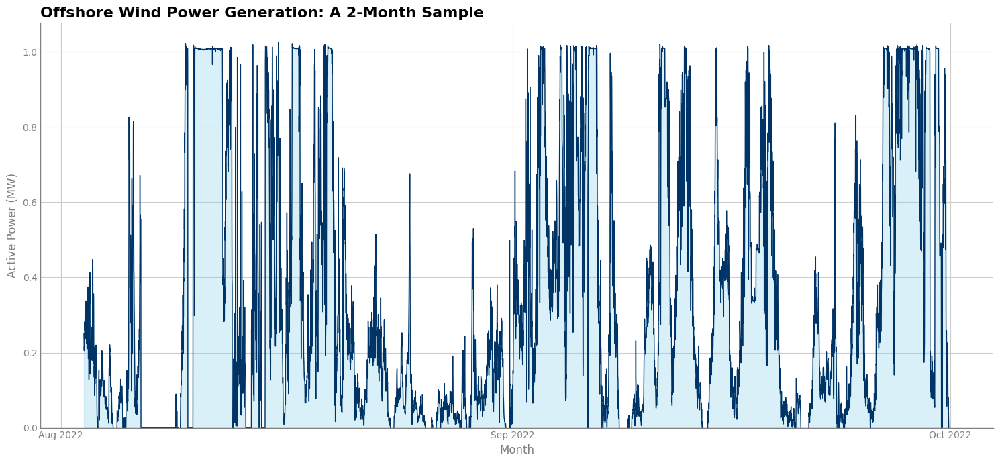

In [6]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd
import numpy as np # Precisamos do numpy para o gradiente

# --- CONTEXTO E FILTRAGEM (Corrigidos e mantidos) ---
target_year = 2022
start_month_continuous = 1 
num_months = 2

# Filtra os dados usando as colunas 'Year' e 'Month' que você já preparou.
plot_data = new_data[
    (new_data['Year'] == target_year) &
    (new_data['Month'] >= start_month_continuous) &
    (new_data['Month'] < start_month_continuous + num_months)
].copy()

# --- CÓDIGO DO GRÁFICO COLORIDO ---

# 1. Configuração do Estilo e da Figura
plt.style.use('seaborn-v0_8-whitegrid') 
fig, ax = plt.subplots(figsize=(15, 7))

# 2. Plotagem dos Dados com Efeito de Gradiente
if not plot_data.empty:
    # Linha principal: um azul escuro e sólido para clareza
    line_color = '#003366' # Um azul marinho profissional
    ax.plot(plot_data['Date'], plot_data['LV ActivePower (kW)'], 
            color=line_color,
            linewidth=1.0) # Linha um pouco mais espessa para se destacar do gradiente

    # --- Lógica do Preenchimento com Gradiente ---
    # Cria um gradiente que vai de um azul claro (embaixo) a mais escuro (em cima)
    x = plot_data['Date'].values
    y = plot_data['LV ActivePower (kW)'].values
    
    # O 'fill_between' cria o preenchimento. A mágica do gradiente vem do 'imshow'.
    # Usamos um gradiente vertical simples de azul claro para transparente.
    gradient_color = 'Blues' # Paleta de cores do Matplotlib
    ax.fill_between(x, 0, y, color='skyblue', alpha=0.3) # Um preenchimento base azul claro

else:
    ax.text(0.5, 0.5, 'No data available for the selected period.', 
            ha='center', va='center', fontsize=14, color='red')

# 3. Melhoria da Estética
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('gray')
ax.spines['bottom'].set_color('gray')
ax.tick_params(axis='x', colors='gray')
ax.tick_params(axis='y', colors='gray')

# 4. Formatação do Eixo X para Meses
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b %Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=1))
plt.setp(ax.get_xticklabels(), rotation=0, ha="center")

# 5. Títulos e Rótulos
ax.set_title(f'Offshore Wind Power Generation: A {num_months}-Month Sample', 
             fontsize=16, fontweight='bold', color='black', loc='left')
ax.set_xlabel('Month', fontsize=12, color='gray')
ax.set_ylabel('Active Power (MW)', fontsize=12, color='gray')
ax.set_ylim(bottom=0) 

# 6. Layout Final
fig.tight_layout()

# Salva a figura em alta resolução
plt.savefig('wind_power_multimonth_colorful.png', dpi=300, bbox_inches='tight')
plt.show()


**Parameter Settings**

In [7]:
i=[1,2,3,4,5,6] #enter month value, i.e January = 1
look_back=6
data_partition=0.8

In [8]:
'''!pip install EMD-signal
!pip install tensorflow_docs
!pip install ewtpy
!pip install optuna'''

'!pip install EMD-signal\n!pip install tensorflow_docs\n!pip install ewtpy\n!pip install optuna'

In [9]:
from myfunctions import svr_model,proposed_method_tft_balanced_with_optuna, svr_model_optuna,ann_model_optuna,ann_quantile_model_with_rri, rf_model,rf_model_optuna,lstm_model,bilstm_model,bilstm_att_model,cnn_bilstm_att_model, emd_lstm,eemd_lstm,ceemdan_lstm,proposed_method,cnn_bilstm_model,cnn_bilstm_model_with_optuna,cnn_bilstm_att_model_with_optuna

2025-11-22 15:23:47.314321: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1763825027.362935    3845 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1763825027.377417    3845 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1763825027.482340    3845 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763825027.482478    3845 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1763825027.482481    3845 computation_placer.cc:177] computation placer alr

In [10]:
from myfunctions import proposed_method_bilstm,proposed_method_bilstm_att,proposed_method_cnn_bilstm,proposed_method_cnn_bilstm_att, transformer_model,tft_model,lstm_model_with_optuna,bilstm_att_model_with_optuna,bilstm_model_with_optuna 

In [11]:
from myfunctions import proposed_method_bilstm_att_optuna,proposed_method_tft_aggregator_interp,proposed_method_tft_aggregator_vsn,proposed_method_tft_aggregator_with_optuna,proposed_method_gru,transformer_model_with_optuna,proposed_method_bilstm_optuna,tft_model_with_optuna,proposed_method_tft_aggregator, proposed_method_lstm_optuna,proposed_method_cnn_bilstm_att_optuna

In [12]:
CUDA_VISIBLE_DEVICES=""

--- EXECUTANDO SVR EM MODO DE TREINAMENTO (ANÁLISE DETERMINÍSTICA) ---
Treinando modelo SVR (previsão de ponto)...
Atribuindo previsão de ponto para todos os quantis (0.1, 0.5, 0.9)...
Modelo SVR e scalers salvos com sucesso.

===== Métricas Completas SVR (Previsão de Ponto) =====
Horizonte t+10: MAPE=4.3495%, RMSE=0.0819, MAE=0.0448, R²=0.9337
Horizonte t+20: MAPE=6.0404%, RMSE=0.1122, MAE=0.0622, R²=0.8754
Horizonte t+30: MAPE=7.0063%, RMSE=0.1258, MAE=0.0721, R²=0.8434


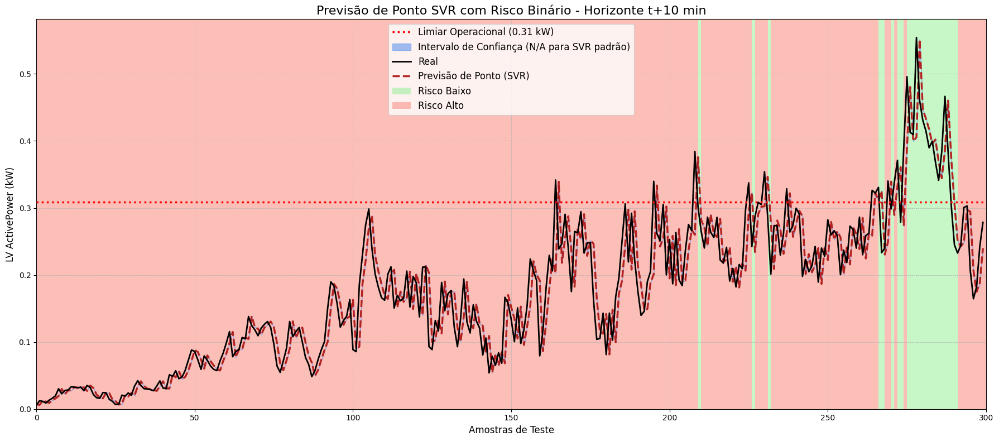

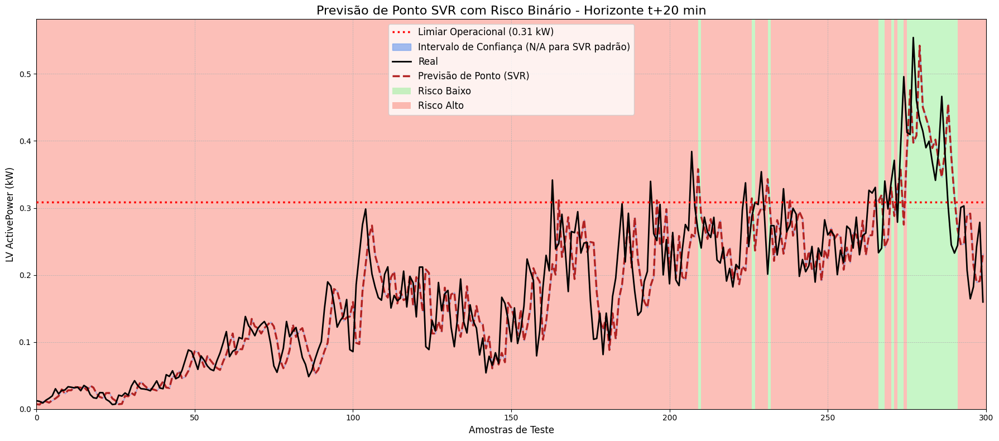

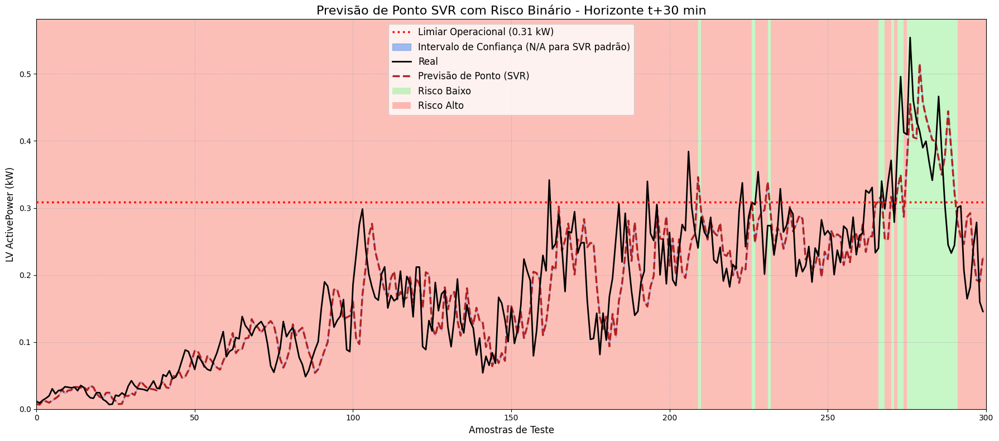

({0.1: array([[0.00680898, 0.00724712, 0.00744249],
         [0.00625497, 0.00660141, 0.00650395],
         [0.01229831, 0.01197281, 0.01211748],
         ...,
         [0.80693742, 0.80662005, 0.80669545],
         [0.80671437, 0.80644784, 0.80652753],
         [0.80640381, 0.80614975, 0.80622612]]),
  0.5: array([[0.00680898, 0.00724712, 0.00744249],
         [0.00625497, 0.00660141, 0.00650395],
         [0.01229831, 0.01197281, 0.01211748],
         ...,
         [0.80693742, 0.80662005, 0.80669545],
         [0.80671437, 0.80644784, 0.80652753],
         [0.80640381, 0.80614975, 0.80622612]]),
  0.9: array([[0.00680898, 0.00724712, 0.00744249],
         [0.00625497, 0.00660141, 0.00650395],
         [0.01229831, 0.01197281, 0.01211748],
         ...,
         [0.80693742, 0.80662005, 0.80669545],
         [0.80671437, 0.80644784, 0.80652753],
         [0.80640381, 0.80614975, 0.80622612]])},
 array([[0.0060356, 0.0123626, 0.0114462],
        [0.0123626, 0.0114462, 0.0089552],
    

In [26]:
svr_model(new_data,i,look_back,data_partition,cap)

In [ ]:
svr_model_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
ann_model(new_data,i,look_back,data_partition,cap)

In [ ]:
ann_quantile_model_with_rri(new_data,i,look_back,data_partition,cap)

In [ ]:
ann_model_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
rf_model(new_data,i,look_back,data_partition,cap)

In [ ]:
rf_model_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
lstm_model(new_data,i,look_back,data_partition,cap)

In [ ]:
lstm_model_with_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
bilstm_model(new_data,i,look_back,data_partition,cap)

In [ ]:
bilstm_model_with_optuna(new_data,i,look_back,data_partition,cap)

--- EXECUTANDO BI-LSTM+ATTENTION EM MODO DE TREINAMENTO ---
Treinando modelo Bi-LSTM+Attention para o quantil: 0.1


I0000 00:00:1761741813.712773    4449 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13949 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:1e.0, compute capability: 7.5
I0000 00:00:1761741818.123731    5858 cuda_dnn.cc:529] Loaded cuDNN version 90701


164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Modelo Bi-LSTM+Attention salvo em: saved_models/bilstm_att_model/model_q01.keras
Treinando modelo Bi-LSTM+Attention para o quantil: 0.5
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Modelo Bi-LSTM+Attention salvo em: saved_models/bilstm_att_model/model_q05.keras
Treinando modelo Bi-LSTM+Attention para o quantil: 0.9
164/164 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
Modelo Bi-LSTM+Attention salvo em: saved_models/bilstm_att_model/model_q09.keras
Scalers para Bi-LSTM+Attention salvos com sucesso.
Aplicando correção de cruzamento de quantis...

===== Métricas Completas Bi-LSTM+Attention (baseadas na mediana q=0.5) =====
Horizonte t+10: MAPE=4.6072%, RMSE=0.0823, MAE=0.0474, R²=0.9330
Horizonte t+20: MAPE=6.2033%, RMSE=0.1128, MAE=0.0639, R²=0.8742
Horizonte t+30: MAPE=7.2290%, RMSE=0.1265, MAE=0.0744, R²=0.8415


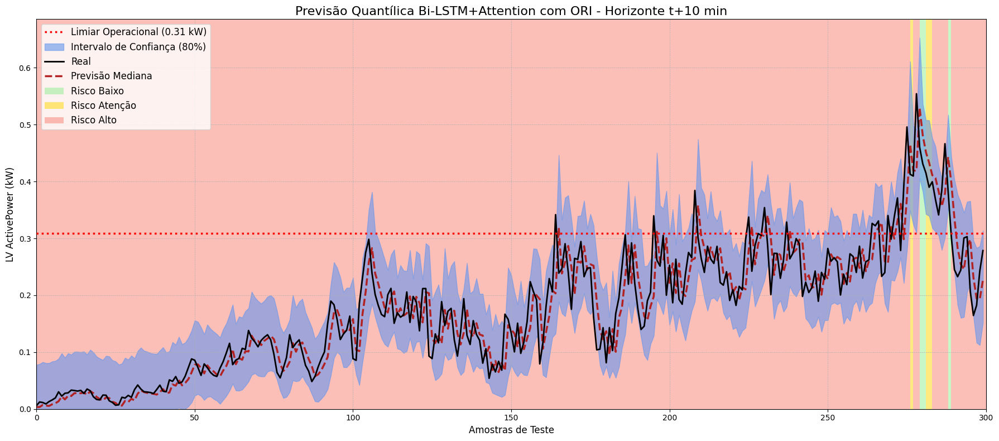

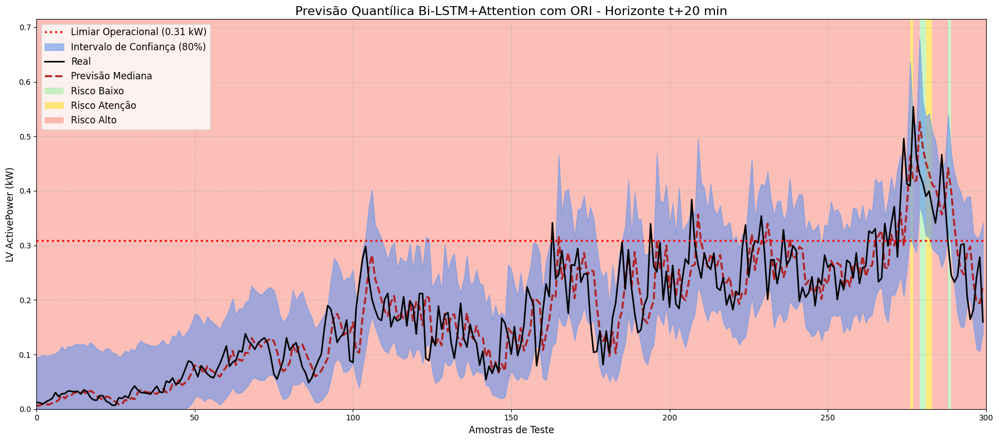

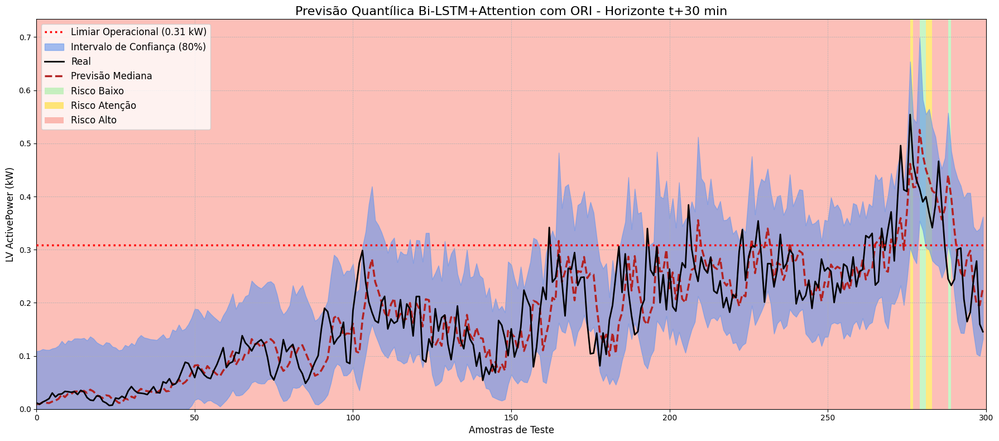

({0.1: array([[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.74853706, 0.7103908 , 0.6885492 ],
         [0.748484  , 0.7103437 , 0.688505  ],
         [0.7483324 , 0.71019   , 0.6883496 ]], dtype=float32),
  0.5: array([[0.00349125, 0.00622077, 0.00931132],
         [0.00355559, 0.00630085, 0.0093956 ],
         [0.00708106, 0.00975858, 0.01279482],
         ...,
         [0.80817056, 0.8071135 , 0.80341583],
         [0.80808234, 0.8070274 , 0.80333006],
         [0.80784917, 0.8067968 , 0.8031009 ]], dtype=float32),
  0.9: array([[0.07763606, 0.09490804, 0.10871103],
         [0.07920951, 0.09610949, 0.10966474],
         [0.08256882, 0.09927301, 0.11267364],
         ...,
         [0.8467581 , 0.8607513 , 0.8667206 ],
         [0.8465969 , 0.8605983 , 0.8665753 ],
         [0.846363  , 0.8604154 , 0.8664268 ]], dtype=float32)},
 array([[0.0060356, 0.0123626, 0.0114462],
  

In [12]:
bilstm_att_model(new_data,i,look_back,data_partition,cap)

In [ ]:
bilstm_att_model_with_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
cnn_bilstm_model(new_data,i,look_back,data_partition,cap)

In [ ]:
cnn_bilstm_model_with_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
cnn_bilstm_att_model(new_data,i,look_back,data_partition,cap)

In [ ]:
cnn_bilstm_att_model_with_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
transformer_model(new_data,i,look_back,data_partition,cap)

In [ ]:
tft_model(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method(new_data,i,look_back,data_partition,cap)

--- EXECUTANDO (CEEMDAN-EWT)-TFT EM MODO DE TREINAMENTO ---
Iniciando decomposição do sinal (CEEMDAN + EWT)...
Decomposição concluída e features salvas.
Construindo e treinando o modelo (CEEMDAN-EWT)-TFT...


I0000 00:00:1762141934.373421   64257 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13949 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:1e.0, compute capability: 7.5
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as bui

Modelo TFT Agregador salvo com sucesso.
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step
Aplicando correção de cruzamento de quantis...

===== Métricas Completas (CEEMDAN-EWT-TFT) =====
Horizonte t+10: MAPE=1.7653%, RMSE=0.0323, MAE=0.0182, R²=0.9897
Horizonte t+20: MAPE=2.3766%, RMSE=0.0442, MAE=0.0245, R²=0.9807
Horizonte t+30: MAPE=2.7386%, RMSE=0.0504, MAE=0.0282, R²=0.9749


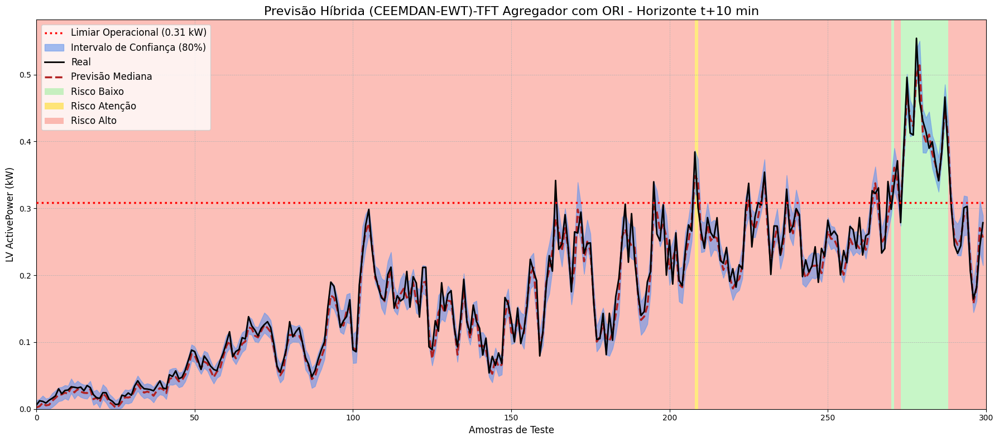

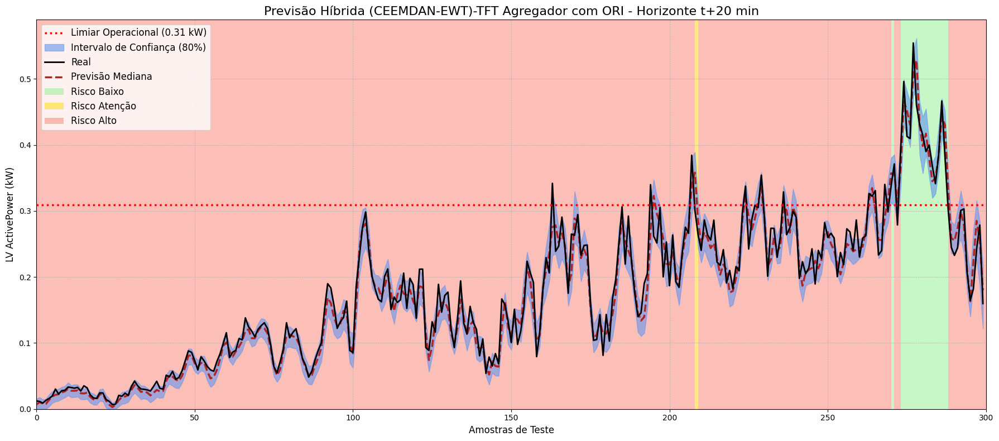

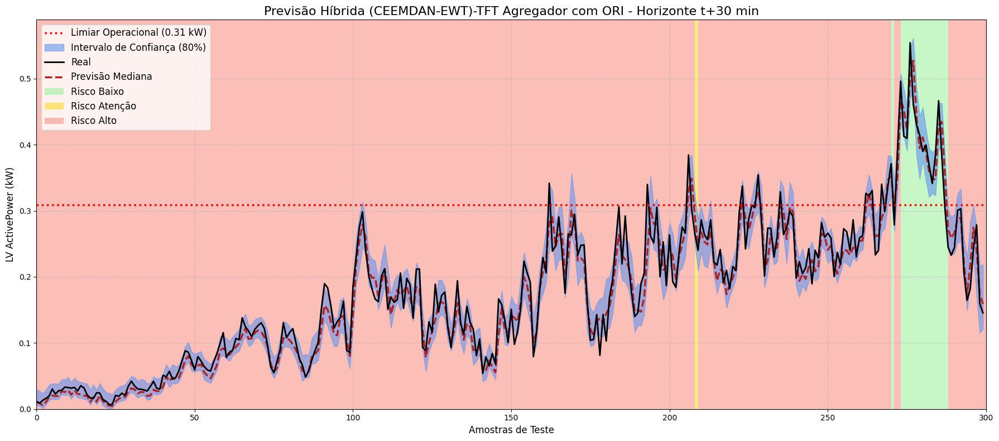

({0.1: array([[0.        , 0.        , 0.00548824],
         [0.        , 0.        , 0.00461784],
         [0.        , 0.        , 0.00106987],
         ...,
         [0.7910525 , 0.78079736, 0.782822  ],
         [0.7942987 , 0.77961874, 0.7786587 ],
         [0.78791744, 0.77944213, 0.78320146]], dtype=float32),
  0.5: array([[0.00236207, 0.00686919, 0.00980711],
         [0.00418409, 0.01028475, 0.00923627],
         [0.00917166, 0.00827002, 0.00538879],
         ...,
         [0.8057744 , 0.8078306 , 0.8120256 ],
         [0.80896145, 0.8067671 , 0.80770475],
         [0.8029454 , 0.8060163 , 0.8120464 ]], dtype=float32),
  0.9: array([[0.01298493, 0.01525053, 0.02935016],
         [0.01499024, 0.01789436, 0.02747902],
         [0.01988691, 0.01435205, 0.02342832],
         ...,
         [0.8262695 , 0.8340627 , 0.83558255],
         [0.8294475 , 0.8324814 , 0.8305299 ],
         [0.8236216 , 0.832756  , 0.83578855]], dtype=float32)},
 array([[0.0060356, 0.0123626, 0.0114462],
  

In [12]:
proposed_method_tft_aggregator(new_data,i,look_back,data_partition,cap)

--- EXECUTANDO proposed_method_tft_aggregator_interp EM MODO DE TREINAMENTO ---


I0000 00:00:1763825409.513296    3845 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20974 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:35:00.0, compute capability: 8.9
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(


Construindo e treinando o modelo (CEEMDAN-EWT)-TFT-Balanced...


I0000 00:00:1763825413.429614   12025 service.cc:152] XLA service 0x7f9b14008570 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763825413.429737   12025 service.cc:160]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-11-22 15:30:13.535068: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1763825414.022286   12025 cuda_dnn.cc:529] Loaded cuDNN version 90701
2025-11-22 15:30:15.098294: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 15:30:15.106668: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stor

Modelo TFT-Balanced salvo com sucesso.


2025-11-22 15:31:48.994241: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 15:31:49.375546: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_16', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 15:31:49.486535: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads



114/164 ━━━━━━━━━━━━━━━━━━━━ 0s 890us/step

2025-11-22 15:31:50.712001: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 15:31:51.174810: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 15:31:51.524533: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_16', 8 bytes spill stores, 8 bytes spill loads



164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step


2025-11-22 15:31:52.770770: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_9', 4 bytes spill stores, 4 bytes spill loads



130/164 ━━━━━━━━━━━━━━━━━━━━ 0s 782us/step

2025-11-22 15:31:53.902447: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_9', 4 bytes spill stores, 4 bytes spill loads



164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step

===== Métricas Completas (proposed_method_tft_aggregator_interp) =====
Horizonte t+10: MAPE=1.7907%, RMSE=0.0311, MAE=0.0184, R²=0.9905
Horizonte t+20: MAPE=2.3532%, RMSE=0.0436, MAE=0.0242, R²=0.9812
Horizonte t+30: MAPE=2.6681%, RMSE=0.0470, MAE=0.0275, R²=0.9781


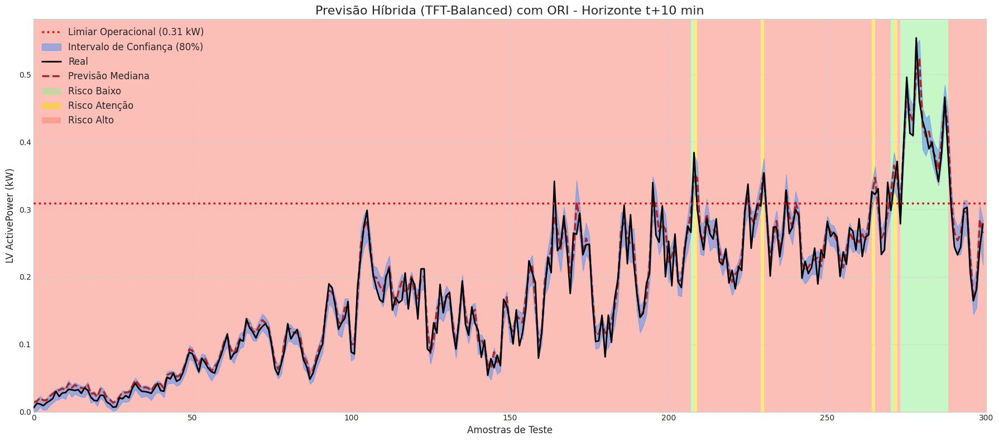

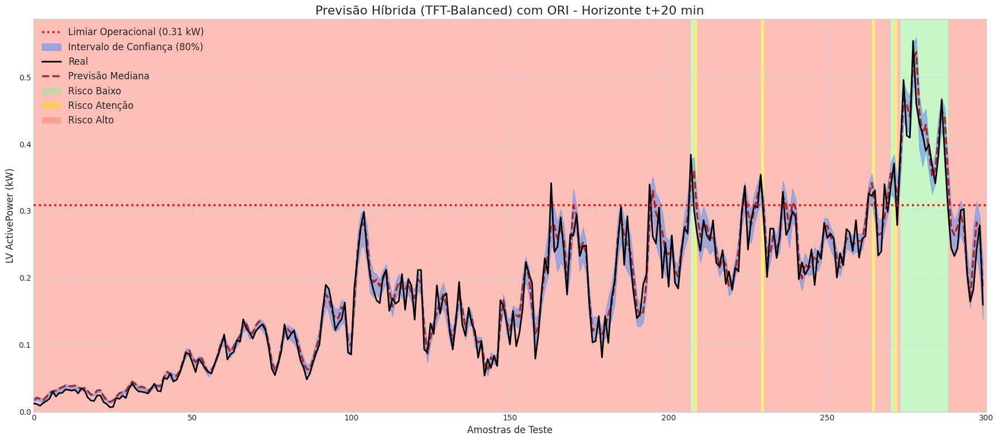

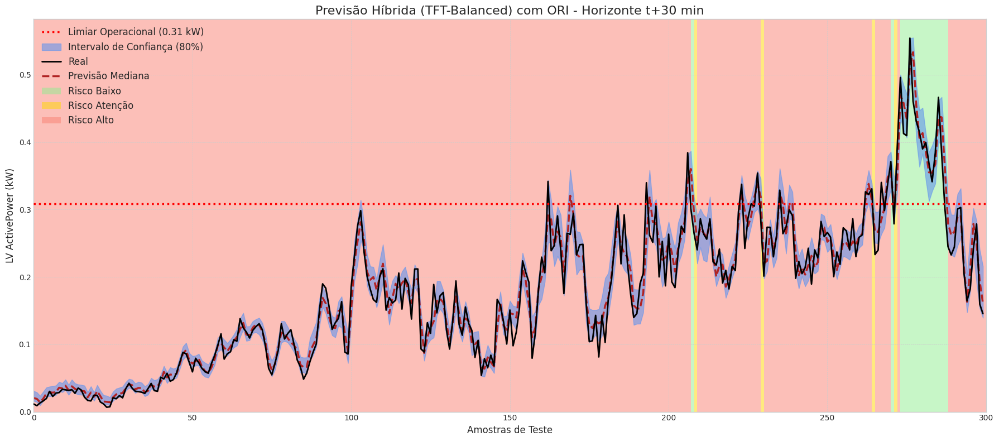

({0.1: array([[0.        , 0.01487306, 0.01596492],
         [0.00133258, 0.0173828 , 0.01439801],
         [0.00709527, 0.01537752, 0.00965404],
         ...,
         [0.79268974, 0.7813144 , 0.77709377],
         [0.7956844 , 0.7802322 , 0.7724877 ],
         [0.78979903, 0.7800703 , 0.77756506]], dtype=float32),
  0.5: array([[0.01417839, 0.01753551, 0.02033287],
         [0.01531881, 0.02057913, 0.0190582 ],
         [0.02078923, 0.01935613, 0.01405918],
         ...,
         [0.8140278 , 0.81233567, 0.80968726],
         [0.8170346 , 0.8114405 , 0.8051377 ],
         [0.81137866, 0.810818  , 0.8100726 ]], dtype=float32),
  0.9: array([[0.0162915 , 0.02048889, 0.03080776],
         [0.01804572, 0.02323147, 0.02873659],
         [0.02335527, 0.02080199, 0.02360576],
         ...,
         [0.8390234 , 0.84280443, 0.84429896],
         [0.842255  , 0.8413737 , 0.8391884 ],
         [0.8366939 , 0.84169173, 0.8450265 ]], dtype=float32)},
 array([[0.0060356, 0.0123626, 0.0114462],
  

In [12]:
proposed_method_tft_aggregator_interp(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_bilstm(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_bilstm_att(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_cnn_bilstm(new_data,i,look_back,data_partition,cap)

--- EXECUTANDO proposed_method_cnn_bilstm_att EM MODO DE TREINAMENTO ---
Iniciando decomposição do sinal (CEEMDAN + EWT)...
Decomposição concluída e salva.
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_denoised ---


I0000 00:00:1761744449.593064    3371 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13949 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:1e.0, compute capability: 7.5
I0000 00:00:1761744453.874098   22584 cuda_dnn.cc:529] Loaded cuDNN version 90701


--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_1 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_2 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_3 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_4 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_5 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_6 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_7 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_8 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_9 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_10 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_11 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_12 ---
--- Q0.1 | Treinando CNN-BiLSTM-Attn para: imf_13 ---
--- Q0.5 | Treinando CNN-BiLSTM-Attn para: imf_denoised ---
--- Q0.5 | Treinando CNN-BiLSTM-Attn para: imf_1 ---
--- Q0.5 | Treinando CNN-BiLSTM-Attn para: imf_2 ---
--- Q0.5 | Treinando CNN-BiLSTM-Attn para: imf_3 ---
--- Q0.5 | Treinando CNN-BiLSTM-Attn para: imf_4 ---
--- Q0.5 | Treinando CNN-BiLSTM-Att

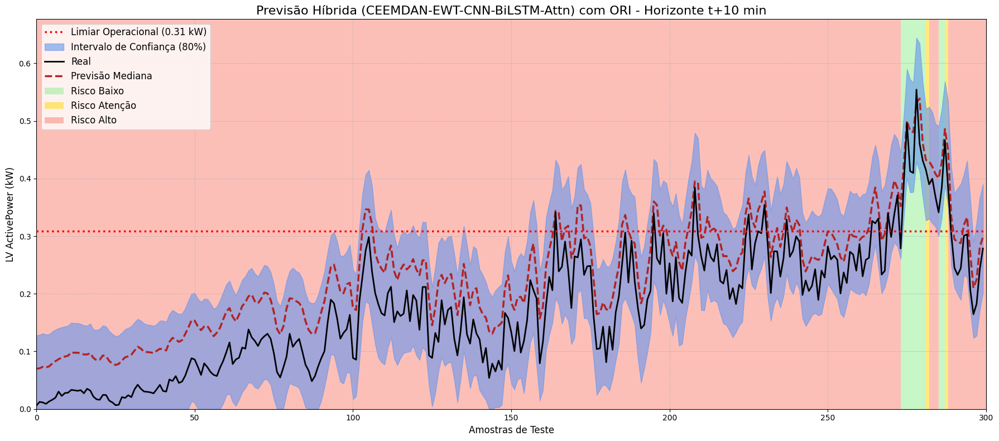

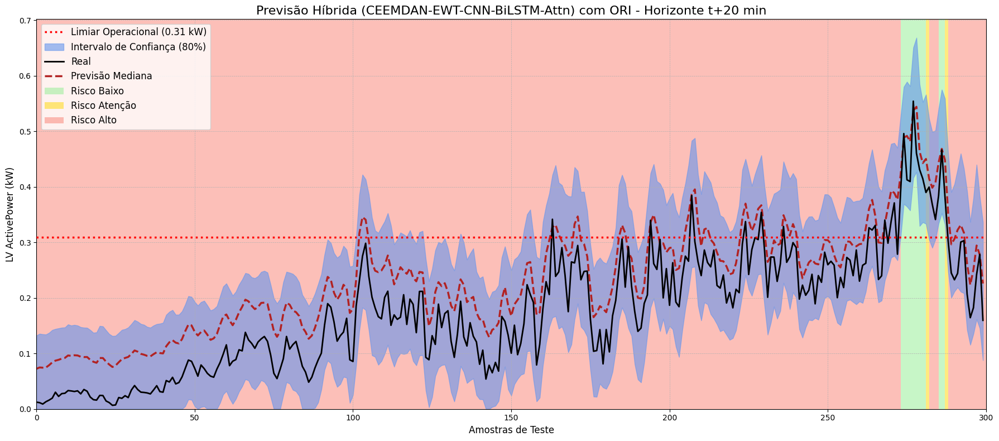

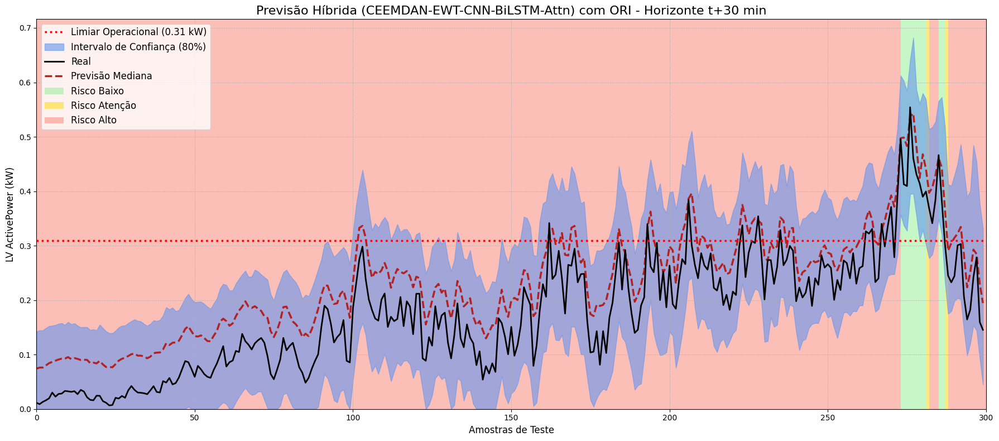

({0.1: array([[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.73763055, 0.7390814 , 0.7328993 ],
         [0.73738706, 0.73648953, 0.73070633],
         [0.7363193 , 0.7376117 , 0.7321378 ]], dtype=float32),
  0.5: array([[0.06990001, 0.07250217, 0.07425025],
         [0.07073346, 0.0748412 , 0.07610521],
         [0.07314411, 0.07444671, 0.07620701],
         ...,
         [0.8003549 , 0.7978904 , 0.79829663],
         [0.8000108 , 0.79604846, 0.796733  ],
         [0.7992059 , 0.79641163, 0.7971369 ]], dtype=float32),
  0.9: array([[0.12791869, 0.13234752, 0.14254335],
         [0.1288645 , 0.13549647, 0.14460531],
         [0.1312443 , 0.134615  , 0.144409  ],
         ...,
         [0.8943387 , 0.8983246 , 0.90635574],
         [0.8944679 , 0.89616984, 0.9040537 ],
         [0.8932132 , 0.8965843 , 0.9053476 ]], dtype=float32)},
 array([[0.0060356, 0.0123626, 0.0114462],
  

In [14]:
proposed_method_cnn_bilstm_att(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_lstm_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_bilstm_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_bilstm_att_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
proposed_method_cnn_bilstm_att_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
transformer_model_with_optuna(new_data,i,look_back,data_partition,cap)

In [ ]:
tft_model_with_optuna(new_data,i,look_back,data_partition,cap)

In [12]:
proposed_method_tft_balanced_with_optuna(new_data,i,look_back,data_partition,cap)

--- PREPARANDO DADOS PARA OTIMIZAÇÃO E TREINO DO CEEMDAN-EWT-TFT-BALANCED ---


[I 2025-11-22 01:54:53,441] A new study created in memory with name: no-name-3bf74343-3c9c-43ee-8485-076e7ac84df2


Dados preparados: 21006 amostras de treino, 5246 amostras de teste.

--- INICIANDO BUSCA DE HIPERPARÂMETROS PARA CEEMDAN-EWT-TFT-BALANCED COM OPTUNA ---


  0%|          | 0/60 [00:00<?, ?it/s]

I0000 00:00:1763776493.940346   12229 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 20974 MB memory:  -> device: 0, name: NVIDIA L4, pci bus id: 0000:35:00.0, compute capability: 8.9
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
I0000 00:00:1763776497.754499   32149 service.cc:152] XLA service 0x7ff1ec00e340 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1763776497.754700   32149 service.cc:160]   StreamExecutor device (0): NVIDIA L4, Compute Capability 8.9
2025-11-22 01:54:57.860401: I 

[I 2025-11-22 01:56:40,101] Trial 0 finished with value: 9.740380532905098 and parameters: {'hidden_units': 64, 'dropout_rate': 0.3652675585107714, 'num_heads': 2, 'learning_rate': 0.00035733794911664557, 'batch_size': 64}. Best is trial 0 with value: 9.740380532905098.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 01:56:44.739447: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 424 bytes spill stores, 352 bytes spill loads

2025-11-22 01:56:45.424746: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_44', 420 bytes spill stores, 332 bytes spill loads

2025-11-22 01:56:45.450874: I external/local_xla/xla/strea

[I 2025-11-22 01:58:30,960] Trial 1 finished with value: 14.595713560724453 and parameters: {'hidden_units': 128, 'dropout_rate': 0.3759921233204483, 'num_heads': 2, 'learning_rate': 0.005449695499690319, 'batch_size': 64}. Best is trial 0 with value: 9.740380532905098.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 01:58:35.119028: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 01:58:44.595806: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 01:58:44.808147: I external/local_xla/xla/stream_execut

[I 2025-11-22 02:00:26,713] Trial 2 finished with value: 12.23045103046921 and parameters: {'hidden_units': 32, 'dropout_rate': 0.10507300505427347, 'num_heads': 2, 'learning_rate': 0.00016193586824214478, 'batch_size': 32}. Best is trial 0 with value: 9.740380532905098.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 02:00:31.037346: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 140 bytes spill stores, 140 bytes spill loads

2025-11-22 02:00:31.143388: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 544 bytes spill stores, 412 bytes spill loads

2025-11-22 02:00:31.308689: I external/local_xla/xla/strea

[I 2025-11-22 02:03:06,182] Trial 3 finished with value: 8.677726113720462 and parameters: {'hidden_units': 64, 'dropout_rate': 0.3253660406093475, 'num_heads': 4, 'learning_rate': 0.0029906868977429483, 'batch_size': 64}. Best is trial 3 with value: 8.677726113720462.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 02:03:10.531264: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_44', 420 bytes spill stores, 332 bytes spill loads

2025-11-22 02:03:10.687118: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_15', 220 bytes spill stores, 256 bytes spill loads

2025-11-22 02:03:10.799311: I external/local_xla/xla/strea

[I 2025-11-22 02:06:14,723] Trial 4 finished with value: 10.21433344324142 and parameters: {'hidden_units': 128, 'dropout_rate': 0.23799739747465395, 'num_heads': 2, 'learning_rate': 0.00024343262288883128, 'batch_size': 32}. Best is trial 3 with value: 8.677726113720462.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 02:06:19.034310: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 432 bytes spill stores, 344 bytes spill loads

2025-11-22 02:06:19.258547: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 428 bytes spill stores, 340 bytes spill loads

2025-11-22 02:06:19.487569: I external/local_xla/xla/strea

[I 2025-11-22 02:11:55,312] Trial 5 finished with value: 8.047513086153502 and parameters: {'hidden_units': 128, 'dropout_rate': 0.10232803612501938, 'num_heads': 8, 'learning_rate': 0.0009356396796148831, 'batch_size': 32}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:13:36,249] Trial 6 finished with value: 17.041075099009497 and parameters: {'hidden_units': 128, 'dropout_rate': 0.33383118573202897, 'num_heads': 2, 'learning_rate': 0.005682592887073217, 'batch_size': 64}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 02:13:40.171545: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 02:13:40.416814: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 02:13:50.190143: I external/local_xla/xla/stream_execut

[I 2025-11-22 02:15:05,250] Trial 7 finished with value: 10.021096259044251 and parameters: {'hidden_units': 32, 'dropout_rate': 0.1486846365315479, 'num_heads': 4, 'learning_rate': 0.0002417407151698197, 'batch_size': 64}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 02:15:09.687853: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 452 bytes spill stores, 356 bytes spill loads

2025-11-22 02:15:09.922644: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 428 bytes spill stores, 340 bytes spill loads

2025-11-22 02:15:09.967312: I external/local_xla/xla/strea

[I 2025-11-22 02:17:20,677] Trial 8 finished with value: 8.474754935337485 and parameters: {'hidden_units': 128, 'dropout_rate': 0.2876583401192419, 'num_heads': 4, 'learning_rate': 0.0007812476034131888, 'batch_size': 64}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:20:04,263] Trial 9 finished with value: 11.995434858619424 and parameters: {'hidden_units': 128, 'dropout_rate': 0.25055009066400746, 'num_heads': 2, 'learning_rate': 0.0002643031341572148, 'batch_size': 32}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 02:20:08.197466: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 02:20:08.222411: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 24 bytes spill stores, 24 bytes spill loads

2025-11-22 02:20:08.305931: I external/local_xla/xla/stream_exec

[I 2025-11-22 02:23:05,875] Trial 10 finished with value: 8.80914184399448 and parameters: {'hidden_units': 32, 'dropout_rate': 0.18463636277442108, 'num_heads': 8, 'learning_rate': 0.0014698758994966359, 'batch_size': 32}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:28:06,742] Trial 11 finished with value: 8.434567335076173 and parameters: {'hidden_units': 128, 'dropout_rate': 0.2808409142580031, 'num_heads': 8, 'learning_rate': 0.0008627629720800986, 'batch_size': 32}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:32:36,730] Trial 12 finished with value: 9.406584074010546 and parameters: {'hidden_units': 128, 'dropout_rate': 0.1980486280484252, 'num_heads': 8, 'learning_rate': 0.000883996123491131, 'batch_size': 32}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:35:49,344] Trial 13 finished with value: 9.067406418753668 and parameters: {'hidden_units': 128, 'dropout_rate': 0.27062384703538866, 'num_heads': 8, 'learning_rate': 0.0016811332551829054, 'batch_size': 32}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:40:10,564] Trial 14 finished with value: 8.66468517910384 and parameters: {'hidden_units': 128, 'dropout_rate': 0.10259883068398111, 'num_heads': 8, 'learning_rate': 0.0006737845890803829, 'batch_size': 32}. Best is trial 5 with value: 8.047513086153502.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 02:40:15.259788: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 432 bytes spill stores, 336 bytes spill loads

2025-11-22 02:40:15.349301: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 288 bytes spill stores, 288 bytes spill loads

2025-11-22 02:40:15.738339: I external/local_xla/xla/strea

[I 2025-11-22 02:44:14,379] Trial 15 finished with value: 7.807181999534891 and parameters: {'hidden_units': 64, 'dropout_rate': 0.20948578555364977, 'num_heads': 8, 'learning_rate': 0.000519524557631545, 'batch_size': 32}. Best is trial 15 with value: 7.807181999534891.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:48:42,685] Trial 16 finished with value: 7.39208106271971 and parameters: {'hidden_units': 64, 'dropout_rate': 0.15421944363699996, 'num_heads': 8, 'learning_rate': 0.0004878499463013936, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:50:40,962] Trial 17 finished with value: 13.836909550683815 and parameters: {'hidden_units': 64, 'dropout_rate': 0.17510125487058117, 'num_heads': 8, 'learning_rate': 0.00010934608674157798, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:53:57,237] Trial 18 finished with value: 8.057227988330382 and parameters: {'hidden_units': 64, 'dropout_rate': 0.21846515069039082, 'num_heads': 8, 'learning_rate': 0.00041173945408663103, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:56:25,486] Trial 19 finished with value: 8.777621684041355 and parameters: {'hidden_units': 64, 'dropout_rate': 0.14527998875635212, 'num_heads': 8, 'learning_rate': 0.00048192886698891605, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 02:59:52,161] Trial 20 finished with value: 8.029672028600714 and parameters: {'hidden_units': 64, 'dropout_rate': 0.15412730261430502, 'num_heads': 8, 'learning_rate': 0.001796784796420817, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:03:26,821] Trial 21 finished with value: 7.6498036035867445 and parameters: {'hidden_units': 64, 'dropout_rate': 0.14659896491106977, 'num_heads': 8, 'learning_rate': 0.0029407831095515087, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:06:55,730] Trial 22 finished with value: 14.324056180674367 and parameters: {'hidden_units': 64, 'dropout_rate': 0.13155872033100705, 'num_heads': 8, 'learning_rate': 0.0031566898135073395, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:11:17,438] Trial 23 finished with value: 24.256346139693093 and parameters: {'hidden_units': 64, 'dropout_rate': 0.21440773250522388, 'num_heads': 8, 'learning_rate': 0.009871119965168318, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:14:43,114] Trial 24 finished with value: 8.401791087053601 and parameters: {'hidden_units': 64, 'dropout_rate': 0.1696683370466965, 'num_heads': 8, 'learning_rate': 0.0005856031381189636, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:18:28,678] Trial 25 finished with value: 8.888100011211927 and parameters: {'hidden_units': 64, 'dropout_rate': 0.12605743766852404, 'num_heads': 4, 'learning_rate': 0.0014997474274587314, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:21:29,427] Trial 26 finished with value: 8.770869194206917 and parameters: {'hidden_units': 64, 'dropout_rate': 0.2167882217310872, 'num_heads': 8, 'learning_rate': 0.00279372568154706, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:25:02,130] Trial 27 finished with value: 8.646212423674529 and parameters: {'hidden_units': 64, 'dropout_rate': 0.1926152522476319, 'num_heads': 8, 'learning_rate': 0.0012389505365032964, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:27:50,447] Trial 28 finished with value: 9.307299122652575 and parameters: {'hidden_units': 64, 'dropout_rate': 0.16310074971495372, 'num_heads': 8, 'learning_rate': 0.00032908905961195645, 'batch_size': 32}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:30:05,075] Trial 29 finished with value: 7.770255950054826 and parameters: {'hidden_units': 64, 'dropout_rate': 0.12883209023612052, 'num_heads': 4, 'learning_rate': 0.002230327521388971, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:32:21,359] Trial 30 finished with value: 7.639892114324858 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3991484870153243, 'num_heads': 4, 'learning_rate': 0.002222833304915853, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:34:33,465] Trial 31 finished with value: 7.629786223354171 and parameters: {'hidden_units': 32, 'dropout_rate': 0.34407271121583877, 'num_heads': 4, 'learning_rate': 0.002250345861025407, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:36:27,346] Trial 32 finished with value: 8.015765865023942 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3594996945021943, 'num_heads': 4, 'learning_rate': 0.004519989221542062, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:38:30,294] Trial 33 finished with value: 8.049129856261223 and parameters: {'hidden_units': 32, 'dropout_rate': 0.39781264173724845, 'num_heads': 4, 'learning_rate': 0.004663134337872953, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:40:19,724] Trial 34 finished with value: 7.957237596883452 and parameters: {'hidden_units': 32, 'dropout_rate': 0.39983376354422917, 'num_heads': 4, 'learning_rate': 0.003619345208334474, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:42:35,359] Trial 35 finished with value: 7.716623723312303 and parameters: {'hidden_units': 32, 'dropout_rate': 0.36511748290223417, 'num_heads': 4, 'learning_rate': 0.0023749289534465328, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:44:21,704] Trial 36 finished with value: 9.343218820406126 and parameters: {'hidden_units': 32, 'dropout_rate': 0.31993593482196125, 'num_heads': 4, 'learning_rate': 0.007290896475841244, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 03:44:26.063523: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to b

[I 2025-11-22 03:46:28,056] Trial 37 finished with value: 7.648470427709266 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3820491190861024, 'num_heads': 2, 'learning_rate': 0.0011728137424657891, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:48:05,865] Trial 38 finished with value: 8.664628609287407 and parameters: {'hidden_units': 32, 'dropout_rate': 0.34828994893270826, 'num_heads': 2, 'learning_rate': 0.0011008938811912937, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:50:23,259] Trial 39 finished with value: 8.10094272339455 and parameters: {'hidden_units': 32, 'dropout_rate': 0.38488777809728464, 'num_heads': 2, 'learning_rate': 0.0011857626544509977, 'batch_size': 64}. Best is trial 16 with value: 7.39208106271971.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:52:47,664] Trial 40 finished with value: 6.678123204951511 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3140055209012673, 'num_heads': 2, 'learning_rate': 0.001946204160646281, 'batch_size': 64}. Best is trial 40 with value: 6.678123204951511.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:55:20,824] Trial 41 finished with value: 6.6256778289812175 and parameters: {'hidden_units': 32, 'dropout_rate': 0.30594407849772465, 'num_heads': 2, 'learning_rate': 0.0024005989556429123, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:57:39,328] Trial 42 finished with value: 7.2633466843287104 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3194543928709673, 'num_heads': 2, 'learning_rate': 0.0021022257623935594, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 03:59:41,369] Trial 43 finished with value: 7.808874519898975 and parameters: {'hidden_units': 32, 'dropout_rate': 0.30208505651360545, 'num_heads': 2, 'learning_rate': 0.00181010524671374, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:01:39,450] Trial 44 finished with value: 8.649175157765653 and parameters: {'hidden_units': 32, 'dropout_rate': 0.309517577750025, 'num_heads': 2, 'learning_rate': 0.003512204535892433, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:03:37,186] Trial 45 finished with value: 8.208582092233192 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3381633999454987, 'num_heads': 2, 'learning_rate': 0.002117619493740574, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:05:05,325] Trial 46 finished with value: 8.382264387351574 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2580059671914435, 'num_heads': 2, 'learning_rate': 0.0013793329599798901, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:07:31,754] Trial 47 finished with value: 7.879261154091161 and parameters: {'hidden_units': 32, 'dropout_rate': 0.285810264186501, 'num_heads': 2, 'learning_rate': 0.004230374708263511, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:09:11,808] Trial 48 finished with value: 9.979910856146132 and parameters: {'hidden_units': 32, 'dropout_rate': 0.29960165042008446, 'num_heads': 2, 'learning_rate': 0.0007469057769460347, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:11:35,120] Trial 49 finished with value: 7.284533475856293 and parameters: {'hidden_units': 32, 'dropout_rate': 0.32201763032455416, 'num_heads': 2, 'learning_rate': 0.006296080431526435, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:13:09,357] Trial 50 finished with value: 9.370336573308899 and parameters: {'hidden_units': 32, 'dropout_rate': 0.31957144898624357, 'num_heads': 2, 'learning_rate': 0.006302996140988967, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:14:48,357] Trial 51 finished with value: 10.39411559366041 and parameters: {'hidden_units': 32, 'dropout_rate': 0.35128713182927535, 'num_heads': 2, 'learning_rate': 0.008380224522266158, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:16:30,590] Trial 52 finished with value: 8.376259937657645 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3401417822139683, 'num_heads': 2, 'learning_rate': 0.0026379647792102766, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:18:58,125] Trial 53 finished with value: 7.8163308689174045 and parameters: {'hidden_units': 32, 'dropout_rate': 0.33180912110258376, 'num_heads': 2, 'learning_rate': 0.001965984818178695, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:21:09,322] Trial 54 finished with value: 8.115345260512763 and parameters: {'hidden_units': 32, 'dropout_rate': 0.27109882468249263, 'num_heads': 2, 'learning_rate': 0.0037660554937417705, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:23:06,970] Trial 55 finished with value: 8.153351761477277 and parameters: {'hidden_units': 32, 'dropout_rate': 0.31176819954704255, 'num_heads': 2, 'learning_rate': 0.005714349086399755, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:24:53,991] Trial 56 finished with value: 12.28801526172177 and parameters: {'hidden_units': 128, 'dropout_rate': 0.2931703296610669, 'num_heads': 2, 'learning_rate': 0.0009640642333786569, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:27:01,808] Trial 57 finished with value: 7.930248981159309 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2326378068164499, 'num_heads': 2, 'learning_rate': 0.0015347556229123999, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:28:35,783] Trial 58 finished with value: 10.58539048327817 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3267641240013451, 'num_heads': 2, 'learning_rate': 0.00016877752008807493, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-22 04:31:08,425] Trial 59 finished with value: 7.4367222160417095 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2754414258170594, 'num_heads': 2, 'learning_rate': 0.002554327529252718, 'batch_size': 64}. Best is trial 41 with value: 6.6256778289812175.

OTIMIZAÇÃO DO CEEMDAN-EWT-TFT-BALANCED CONCLUÍDA
Melhor resultado (MAPE médio na validação): 6.6257%

Hiperparâmetros Ótimos Encontrados:
  - hidden_units: 32
  - dropout_rate: 0.30594407849772465
  - num_heads: 2
  - learning_rate: 0.0024005989556429123
  - batch_size: 64

--- TREINANDO MODELO CEEMDAN-EWT-TFT-BALANCED FINAL COM OS MELHORES PARÂMETROS ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-22 04:31:16.323109: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_46', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 04:31:22.059384: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 04:31:22.308496: I external/local_xla/xla/stream_execut

Epoch 70: early stopping
Restoring model weights from the end of the best epoch: 50.
Treinamento final concluído.


2025-11-22 04:32:08.477598: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_16', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 04:32:08.546689: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads

2025-11-22 04:32:08.705197: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_17', 8 bytes spill stores, 8 bytes spill loads

/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/sklearn/base.py:465: UserWarning: X does not have valid feature names, but StandardScaler was fitted with feature names
  warnings.warn(


ValueError: X has 3 features, but StandardScaler is expecting 1 features as input.

--- PREPARANDO DADOS PARA OTIMIZAÇÃO E TREINO DO CEEMDAN-EWT-TFT ---


[I 2025-11-01 20:10:57,637] A new study created in memory with name: no-name-b8fa144b-5439-432c-95ea-be419dc6235c


Dados preparados: 21006 amostras de treino, 5246 amostras de teste.

--- INICIANDO BUSCA DE HIPERPARÂMETROS PARA CEEMDAN-EWT-TFT COM OPTUNA ---


  0%|          | 0/100 [00:00<?, ?it/s]

I0000 00:00:1762027858.143079    3887 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 43629 MB memory:  -> device: 0, name: NVIDIA L40S, pci bus id: 0000:34:00.0, compute capability: 8.9
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as 

[I 2025-11-01 20:14:42,823] Trial 0 finished with value: 10.18133841042055 and parameters: {'hidden_units': 128, 'dropout_rate': 0.23719524738420303, 'num_heads': 8, 'learning_rate': 0.0005116670643371614, 'batch_size': 32}. Best is trial 0 with value: 10.18133841042055.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:14:47.908261: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:17:08,969] Trial 1 finished with value: 6.993369926951902 and parameters: {'hidden_units': 32, 'dropout_rate': 0.11536036677876338, 'num_heads': 2, 'learning_rate': 0.0035164406767692873, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:20:36,832] Trial 2 finished with value: 8.855551488333836 and parameters: {'hidden_units': 128, 'dropout_rate': 0.20817136698588865, 'num_heads': 8, 'learning_rate': 0.0009420552986919552, 'batch_size': 32}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:20:41.810704: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:22:43,981] Trial 3 finished with value: 8.653272584297381 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3846433066005035, 'num_heads': 8, 'learning_rate': 0.0009882508406370127, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:22:49.428451: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:25:06,675] Trial 4 finished with value: 24.377293668845482 and parameters: {'hidden_units': 128, 'dropout_rate': 0.11025844295589282, 'num_heads': 2, 'learning_rate': 0.0028870365865620454, 'batch_size': 32}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:25:12.634154: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:27:18,375] Trial 5 finished with value: 23.701032003367178 and parameters: {'hidden_units': 64, 'dropout_rate': 0.2267749059409366, 'num_heads': 4, 'learning_rate': 0.003681405611684366, 'batch_size': 32}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:27:23.649284: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:29:09,924] Trial 6 finished with value: 9.745265748335013 and parameters: {'hidden_units': 64, 'dropout_rate': 0.34983209607088894, 'num_heads': 8, 'learning_rate': 0.0002880740570860511, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:29:15.750127: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:31:37,507] Trial 7 finished with value: 10.361055879234055 and parameters: {'hidden_units': 128, 'dropout_rate': 0.22425815209500433, 'num_heads': 8, 'learning_rate': 0.0015032892116519274, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:33:57,765] Trial 8 finished with value: 21.655531143116633 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3243801996518131, 'num_heads': 8, 'learning_rate': 0.007096271977956773, 'batch_size': 32}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:36:48,954] Trial 9 finished with value: 8.125125920981057 and parameters: {'hidden_units': 64, 'dropout_rate': 0.30948747764133344, 'num_heads': 8, 'learning_rate': 0.0015348855579141343, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:38:29,687] Trial 10 finished with value: 12.616894833405658 and parameters: {'hidden_units': 32, 'dropout_rate': 0.10068491871562946, 'num_heads': 2, 'learning_rate': 0.00013514588606592236, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:38:34.873792: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:40:24,531] Trial 11 finished with value: 30.315508365051812 and parameters: {'hidden_units': 64, 'dropout_rate': 0.3108163237521525, 'num_heads': 2, 'learning_rate': 0.009931304058553154, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:40:29.830067: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:43:07,089] Trial 12 finished with value: 9.323182030159048 and parameters: {'hidden_units': 64, 'dropout_rate': 0.1630689781088167, 'num_heads': 4, 'learning_rate': 0.0020445222312836784, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:45:29,412] Trial 13 finished with value: 8.14556623546892 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2798702969790604, 'num_heads': 2, 'learning_rate': 0.0042234496542992005, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:47:59,947] Trial 14 finished with value: 8.135006045405161 and parameters: {'hidden_units': 64, 'dropout_rate': 0.15960817533013866, 'num_heads': 2, 'learning_rate': 0.0005327084604267616, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 20:48:04.816957: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 20:50:52,895] Trial 15 finished with value: 7.184405227597966 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2747048118336488, 'num_heads': 4, 'learning_rate': 0.0017132504563536811, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:52:34,670] Trial 16 finished with value: 9.953579145176793 and parameters: {'hidden_units': 32, 'dropout_rate': 0.17978943883926257, 'num_heads': 4, 'learning_rate': 0.005322060003713645, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:54:32,700] Trial 17 finished with value: 7.953895019443951 and parameters: {'hidden_units': 32, 'dropout_rate': 0.268490498150814, 'num_heads': 4, 'learning_rate': 0.0024278372127964475, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:56:04,952] Trial 18 finished with value: 10.878470060287768 and parameters: {'hidden_units': 32, 'dropout_rate': 0.13361089080473698, 'num_heads': 4, 'learning_rate': 0.0004802273504872841, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 20:58:40,143] Trial 19 finished with value: 8.62251708610418 and parameters: {'hidden_units': 32, 'dropout_rate': 0.19872406119319552, 'num_heads': 4, 'learning_rate': 0.0012330512628131722, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:00:28,615] Trial 20 finished with value: 10.88963198988376 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2658892760930331, 'num_heads': 2, 'learning_rate': 0.006017911859160292, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:02:26,511] Trial 21 finished with value: 8.62163477998225 and parameters: {'hidden_units': 32, 'dropout_rate': 0.27926369204441326, 'num_heads': 4, 'learning_rate': 0.0027530235123470114, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:04:30,954] Trial 22 finished with value: 8.208200810467845 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2701004197872475, 'num_heads': 4, 'learning_rate': 0.002443798355347335, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:07:17,513] Trial 23 finished with value: 7.171696562264974 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2502059776489586, 'num_heads': 4, 'learning_rate': 0.0018316290162980597, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:09:12,970] Trial 24 finished with value: 8.611018296809823 and parameters: {'hidden_units': 32, 'dropout_rate': 0.24905215080419119, 'num_heads': 4, 'learning_rate': 0.0008190628975640996, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:12:41,425] Trial 25 finished with value: 7.6460350227038205 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2955542959613623, 'num_heads': 4, 'learning_rate': 0.0017139828210043855, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:15:59,226] Trial 26 finished with value: 9.884699046568254 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3446043318991259, 'num_heads': 2, 'learning_rate': 0.0035838778367491427, 'batch_size': 32}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:17:44,424] Trial 27 finished with value: 8.62754827333402 and parameters: {'hidden_units': 32, 'dropout_rate': 0.19289155612852088, 'num_heads': 4, 'learning_rate': 0.0007375518104348889, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:19:20,486] Trial 28 finished with value: 12.218450771361304 and parameters: {'hidden_units': 32, 'dropout_rate': 0.13466189200780626, 'num_heads': 2, 'learning_rate': 0.0002513577196300746, 'batch_size': 64}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 21:19:25.733296: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 21:21:53,002] Trial 29 finished with value: 29.569881826887677 and parameters: {'hidden_units': 128, 'dropout_rate': 0.2497151128324336, 'num_heads': 4, 'learning_rate': 0.009411962426690998, 'batch_size': 32}. Best is trial 1 with value: 6.993369926951902.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:24:23,314] Trial 30 finished with value: 6.672504342057862 and parameters: {'hidden_units': 32, 'dropout_rate': 0.22848017062247916, 'num_heads': 2, 'learning_rate': 0.0012394859293135235, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:27:33,889] Trial 31 finished with value: 6.9435317120127165 and parameters: {'hidden_units': 32, 'dropout_rate': 0.22872626908855065, 'num_heads': 2, 'learning_rate': 0.0012499585318117735, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:29:48,745] Trial 32 finished with value: 6.9445160119860425 and parameters: {'hidden_units': 32, 'dropout_rate': 0.21465456747673772, 'num_heads': 2, 'learning_rate': 0.00125485707119066, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 21:29:54.099554: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 21:32:09,068] Trial 33 finished with value: 9.418046392834151 and parameters: {'hidden_units': 128, 'dropout_rate': 0.21703031535736167, 'num_heads': 2, 'learning_rate': 0.0011494541464350603, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:34:58,637] Trial 34 finished with value: 8.295975711430064 and parameters: {'hidden_units': 32, 'dropout_rate': 0.18089421659833047, 'num_heads': 2, 'learning_rate': 0.0004562477450183883, 'batch_size': 32}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:36:42,102] Trial 35 finished with value: 11.062957268308667 and parameters: {'hidden_units': 32, 'dropout_rate': 0.13259001337701196, 'num_heads': 2, 'learning_rate': 0.0006820121475841349, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 21:36:50.780236: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 21:39:40,093] Trial 36 finished with value: 8.124099742826349 and parameters: {'hidden_units': 128, 'dropout_rate': 0.23207597890020476, 'num_heads': 2, 'learning_rate': 0.0009348813060248054, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:43:44,341] Trial 37 finished with value: 7.845201981960792 and parameters: {'hidden_units': 32, 'dropout_rate': 0.39691017351766567, 'num_heads': 2, 'learning_rate': 0.0012645168713180006, 'batch_size': 32}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:45:28,696] Trial 38 finished with value: 11.266513595689306 and parameters: {'hidden_units': 32, 'dropout_rate': 0.20805653363442275, 'num_heads': 2, 'learning_rate': 0.00039676559883031014, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-01 21:45:37.301912: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-01 21:47:58,313] Trial 39 finished with value: 8.0918919575288 and parameters: {'hidden_units': 128, 'dropout_rate': 0.15279138731547, 'num_heads': 2, 'learning_rate': 0.0003160290836166141, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:53:16,246] Trial 40 finished with value: 8.47266080922425 and parameters: {'hidden_units': 32, 'dropout_rate': 0.11906978212315672, 'num_heads': 2, 'learning_rate': 0.000640466059163208, 'batch_size': 32}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:55:52,360] Trial 41 finished with value: 8.090188012017153 and parameters: {'hidden_units': 32, 'dropout_rate': 0.23578516615013193, 'num_heads': 2, 'learning_rate': 0.001958775974398647, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 21:59:36,760] Trial 42 finished with value: 7.486406084558823 and parameters: {'hidden_units': 32, 'dropout_rate': 0.25316731754266747, 'num_heads': 8, 'learning_rate': 0.003200937881645907, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:01:39,456] Trial 43 finished with value: 8.124089979014698 and parameters: {'hidden_units': 32, 'dropout_rate': 0.21927082385114305, 'num_heads': 2, 'learning_rate': 0.000989418116422764, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:03:45,923] Trial 44 finished with value: 9.678721544487058 and parameters: {'hidden_units': 64, 'dropout_rate': 0.24504409979231953, 'num_heads': 2, 'learning_rate': 0.001366189016084251, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:05:53,441] Trial 45 finished with value: 7.811903558468654 and parameters: {'hidden_units': 32, 'dropout_rate': 0.20301580697906813, 'num_heads': 8, 'learning_rate': 0.0021262160697342112, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:08:12,900] Trial 46 finished with value: 7.699596725736292 and parameters: {'hidden_units': 32, 'dropout_rate': 0.17664652808362463, 'num_heads': 2, 'learning_rate': 0.0038845629405638233, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:10:07,796] Trial 47 finished with value: 16.671566420770016 and parameters: {'hidden_units': 64, 'dropout_rate': 0.2988577877627684, 'num_heads': 2, 'learning_rate': 0.004601712509969064, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:12:27,030] Trial 48 finished with value: 7.811934226137605 and parameters: {'hidden_units': 32, 'dropout_rate': 0.22325956800773022, 'num_heads': 8, 'learning_rate': 0.0016381893119248013, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:14:32,967] Trial 49 finished with value: 9.876694682209768 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3433496995013625, 'num_heads': 2, 'learning_rate': 0.0009012119945592294, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:16:45,237] Trial 50 finished with value: 7.699206563181807 and parameters: {'hidden_units': 32, 'dropout_rate': 0.18995645192983712, 'num_heads': 2, 'learning_rate': 0.002950082943783967, 'batch_size': 64}. Best is trial 30 with value: 6.672504342057862.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:20:04,991] Trial 51 finished with value: 6.430637603082086 and parameters: {'hidden_units': 32, 'dropout_rate': 0.26010475808037614, 'num_heads': 4, 'learning_rate': 0.0018087787786653733, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:22:14,060] Trial 52 finished with value: 7.481388951780296 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2930990581696502, 'num_heads': 4, 'learning_rate': 0.001097811896496049, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:25:50,112] Trial 53 finished with value: 6.917475589944413 and parameters: {'hidden_units': 32, 'dropout_rate': 0.255369592930427, 'num_heads': 4, 'learning_rate': 0.0014852899835400162, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:28:50,130] Trial 54 finished with value: 6.584301941304198 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2610613035572551, 'num_heads': 2, 'learning_rate': 0.0014713123508467846, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:30:41,467] Trial 55 finished with value: 8.608166618515531 and parameters: {'hidden_units': 32, 'dropout_rate': 0.26079486717157213, 'num_heads': 2, 'learning_rate': 0.0014886013508618478, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:33:35,343] Trial 56 finished with value: 7.823854510456524 and parameters: {'hidden_units': 32, 'dropout_rate': 0.23404908587764514, 'num_heads': 4, 'learning_rate': 0.0022055650230559257, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:35:59,117] Trial 57 finished with value: 10.166732592596645 and parameters: {'hidden_units': 64, 'dropout_rate': 0.2837887584556689, 'num_heads': 2, 'learning_rate': 0.0014100358673175383, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:37:58,252] Trial 58 finished with value: 13.485702174459417 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2153914715424997, 'num_heads': 4, 'learning_rate': 0.00010007157126336455, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:40:12,964] Trial 59 finished with value: 7.701056239643563 and parameters: {'hidden_units': 32, 'dropout_rate': 0.3221459862043941, 'num_heads': 8, 'learning_rate': 0.0011112371102224522, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:43:37,456] Trial 60 finished with value: 17.623472927620234 and parameters: {'hidden_units': 128, 'dropout_rate': 0.24108299806344294, 'num_heads': 4, 'learning_rate': 0.0025473145509134444, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:45:34,437] Trial 61 finished with value: 9.056891044965958 and parameters: {'hidden_units': 32, 'dropout_rate': 0.25507523712593755, 'num_heads': 2, 'learning_rate': 0.0007808604718993928, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:47:46,230] Trial 62 finished with value: 7.900961073595233 and parameters: {'hidden_units': 32, 'dropout_rate': 0.26075694184414366, 'num_heads': 2, 'learning_rate': 0.0016444575225256174, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:49:41,203] Trial 63 finished with value: 9.235641035458052 and parameters: {'hidden_units': 32, 'dropout_rate': 0.28397050087609865, 'num_heads': 2, 'learning_rate': 0.0005875264702168086, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:53:12,736] Trial 64 finished with value: 6.9376857676018835 and parameters: {'hidden_units': 32, 'dropout_rate': 0.22853596255146702, 'num_heads': 2, 'learning_rate': 0.001253634870977423, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:55:35,492] Trial 65 finished with value: 7.286983531386801 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2268736265194947, 'num_heads': 2, 'learning_rate': 0.001280662741346038, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 22:58:22,936] Trial 66 finished with value: 6.550531383055159 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2088635699991695, 'num_heads': 4, 'learning_rate': 0.0018922801900603347, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:00:26,361] Trial 67 finished with value: 8.03162809499075 and parameters: {'hidden_units': 32, 'dropout_rate': 0.23889526447363343, 'num_heads': 4, 'learning_rate': 0.0018327262202120383, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:03:04,062] Trial 68 finished with value: 8.329082576147995 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2718450813318848, 'num_heads': 4, 'learning_rate': 0.000844636827266984, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:05:05,855] Trial 69 finished with value: 7.963366458377732 and parameters: {'hidden_units': 32, 'dropout_rate': 0.20222571093871836, 'num_heads': 4, 'learning_rate': 0.0010360522620504991, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:07:31,726] Trial 70 finished with value: 8.37291847830783 and parameters: {'hidden_units': 32, 'dropout_rate': 0.22645633986553218, 'num_heads': 4, 'learning_rate': 0.0022343263474962176, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:10:57,487] Trial 71 finished with value: 7.487408880816456 and parameters: {'hidden_units': 32, 'dropout_rate': 0.21288574900093926, 'num_heads': 4, 'learning_rate': 0.001515913550326387, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:12:56,484] Trial 72 finished with value: 8.603216240170712 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2627255043677685, 'num_heads': 2, 'learning_rate': 0.0012752380954116778, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:15:20,084] Trial 73 finished with value: 7.978539372858882 and parameters: {'hidden_units': 32, 'dropout_rate': 0.1893247431439506, 'num_heads': 4, 'learning_rate': 0.0019227125951612996, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:18:37,250] Trial 74 finished with value: 7.267071339011429 and parameters: {'hidden_units': 32, 'dropout_rate': 0.20906566680750757, 'num_heads': 2, 'learning_rate': 0.0014723316386346063, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:23:25,169] Trial 75 finished with value: 6.856273488871117 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2283691138932434, 'num_heads': 2, 'learning_rate': 0.001164904203514983, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:26:59,307] Trial 76 finished with value: 9.221742145930998 and parameters: {'hidden_units': 64, 'dropout_rate': 0.2416190708858477, 'num_heads': 4, 'learning_rate': 0.0011485988934731783, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:31:14,272] Trial 77 finished with value: 6.6719109387351745 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2319837145858365, 'num_heads': 2, 'learning_rate': 0.0009345262218415658, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:35:53,230] Trial 78 finished with value: 8.200145013157888 and parameters: {'hidden_units': 128, 'dropout_rate': 0.255282149003422, 'num_heads': 2, 'learning_rate': 0.0009575787693432893, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:40:23,523] Trial 79 finished with value: 9.13040868177877 and parameters: {'hidden_units': 32, 'dropout_rate': 0.27477648160444396, 'num_heads': 4, 'learning_rate': 0.000749692864024537, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:44:05,252] Trial 80 finished with value: 8.013971619403787 and parameters: {'hidden_units': 32, 'dropout_rate': 0.245000979697489, 'num_heads': 2, 'learning_rate': 0.0017545153190463621, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:48:40,385] Trial 81 finished with value: 7.87560968939123 and parameters: {'hidden_units': 32, 'dropout_rate': 0.23359594290377428, 'num_heads': 2, 'learning_rate': 0.0010496871768793286, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:53:06,859] Trial 82 finished with value: 7.658866723272553 and parameters: {'hidden_units': 32, 'dropout_rate': 0.22490883620382698, 'num_heads': 2, 'learning_rate': 0.0013748922991455913, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-01 23:56:28,778] Trial 83 finished with value: 7.444481572189904 and parameters: {'hidden_units': 32, 'dropout_rate': 0.22832422255028464, 'num_heads': 2, 'learning_rate': 0.0016233475341966151, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:00:22,145] Trial 84 finished with value: 8.038002505485961 and parameters: {'hidden_units': 32, 'dropout_rate': 0.19783998345405684, 'num_heads': 2, 'learning_rate': 0.0008885727158069474, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:04:17,997] Trial 85 finished with value: 7.503939851728568 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2488152954705033, 'num_heads': 8, 'learning_rate': 0.0025910247838094847, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:09:42,714] Trial 86 finished with value: 8.296284374971291 and parameters: {'hidden_units': 32, 'dropout_rate': 0.17124167851942815, 'num_heads': 2, 'learning_rate': 0.0020479180230878, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:13:53,029] Trial 87 finished with value: 7.1490698920194236 and parameters: {'hidden_units': 32, 'dropout_rate': 0.2205628598840466, 'num_heads': 2, 'learning_rate': 0.0012024832892010364, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:16:12,255] Trial 88 finished with value: 10.063812728178855 and parameters: {'hidden_units': 32, 'dropout_rate': 0.26532099173034385, 'num_heads': 4, 'learning_rate': 0.0006703472814504689, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:19:29,652] Trial 89 finished with value: 7.234645993491891 and parameters: {'hidden_units': 32, 'dropout_rate': 0.23669647855370735, 'num_heads': 2, 'learning_rate': 0.0013899159349532735, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:21:46,689] Trial 90 finished with value: 8.345845022483172 and parameters: {'hidden_units': 64, 'dropout_rate': 0.2072021088603987, 'num_heads': 2, 'learning_rate': 0.002239963406865479, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:24:18,419] Trial 91 finished with value: 7.989118630627867 and parameters: {'hidden_units': 32, 'dropout_rate': 0.21642664703823647, 'num_heads': 2, 'learning_rate': 0.0012375658544748589, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:26:23,350] Trial 92 finished with value: 9.655237680168398 and parameters: {'hidden_units': 32, 'dropout_rate': 0.257307288710038, 'num_heads': 2, 'learning_rate': 0.001011100714382595, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:29:37,033] Trial 93 finished with value: 6.94149078875109 and parameters: {'hidden_units': 32, 'dropout_rate': 0.19455255853855405, 'num_heads': 2, 'learning_rate': 0.0018214227767922105, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:32:10,711] Trial 94 finished with value: 8.704198583773978 and parameters: {'hidden_units': 32, 'dropout_rate': 0.18719989003533713, 'num_heads': 2, 'learning_rate': 0.00295074472607124, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-02 00:32:19.359823: I external/local_xla/xla/stream_executor/cuda/su

[I 2025-11-02 00:35:10,406] Trial 95 finished with value: 9.558203852242666 and parameters: {'hidden_units': 128, 'dropout_rate': 0.1949672302596668, 'num_heads': 2, 'learning_rate': 0.001798021428210069, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:38:04,783] Trial 96 finished with value: 7.579530138801224 and parameters: {'hidden_units': 32, 'dropout_rate': 0.24668518753942623, 'num_heads': 4, 'learning_rate': 0.0015287511612879106, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:41:28,718] Trial 97 finished with value: 8.183673671812743 and parameters: {'hidden_units': 32, 'dropout_rate': 0.20474694636282587, 'num_heads': 2, 'learning_rate': 0.001988796393462999, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:43:44,784] Trial 98 finished with value: 8.852649582320568 and parameters: {'hidden_units': 32, 'dropout_rate': 0.23008664885146712, 'num_heads': 8, 'learning_rate': 0.0011206251819316259, 'batch_size': 64}. Best is trial 51 with value: 6.430637603082086.


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src

[I 2025-11-02 00:47:13,570] Trial 99 finished with value: 8.242258222949678 and parameters: {'hidden_units': 32, 'dropout_rate': 0.220766665543839, 'num_heads': 2, 'learning_rate': 0.0016268509830205699, 'batch_size': 32}. Best is trial 51 with value: 6.430637603082086.

OTIMIZAÇÃO DO CEEMDAN-EWT-TFT CONCLUÍDA
Melhor resultado (MAPE médio na validação): 6.4306%

Hiperparâmetros Ótimos Encontrados:
  - hidden_units: 32
  - dropout_rate: 0.26010475808037614
  - num_heads: 4
  - learning_rate: 0.0018087787786653733
  - batch_size: 64

--- TREINANDO MODELO CEEMDAN-EWT-TFT FINAL COM OS MELHORES PARÂMETROS ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_1', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/layer.py:421: UserWarning: `build()` was called on layer 'gated_residual_network_2', however the layer does not have a `build()` method implemented and it looks like it has unbuilt state. This will cause the layer to be marked as built, despite not being actually built, which may cause failures down the line. Make sure to implement a proper `build()` method.
  warnings.warn(
2025-11-02 00:47:23.409580: I external/local_xla/xla/stream_executor/cuda/su

Epoch 44: early stopping
Restoring model weights from the end of the best epoch: 24.
Treinamento final concluído.


2025-11-02 00:48:03.835307: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 8 bytes spill stores, 8 bytes spill loads

2025-11-02 00:48:04.198820: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_20', 8 bytes spill stores, 8 bytes spill loads

2025-11-02 00:48:04.477496: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_21', 8 bytes spill stores, 8 bytes spill loads

2025-11-02 00:48:04.584217: I external/local_xla/xla/stream_executor/cuda/subprocess_compilation.cc:346] ptxas warning : Registers are spilled to local memory in function 'gemm_fusion_dot_20', 8 bytes spill stores, 8 bytes spill loads

2025-11-02 00:48:04.737707: I external/local_xla/xla/str


===== MÉTRICAS FINAIS NO CONJUNTO DE TESTE =====
Horizonte t+10: MAPE=3.3362%, RMSE=0.0505, MAE=0.0343, R²=0.9747
Horizonte t+20: MAPE=3.9486%, RMSE=0.0607, MAE=0.0407, R²=0.9636
Horizonte t+30: MAPE=4.5501%, RMSE=0.0697, MAE=0.0468, R²=0.9519

--- GERANDO GRÁFICOS DE RESULTADOS ---


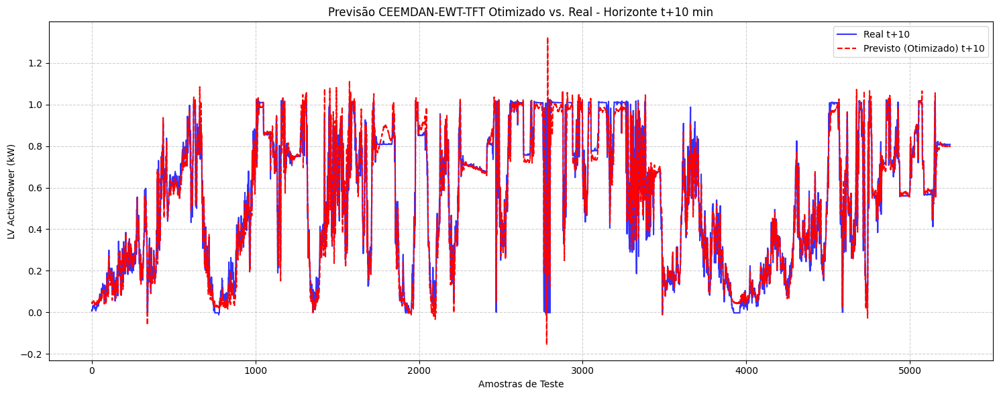

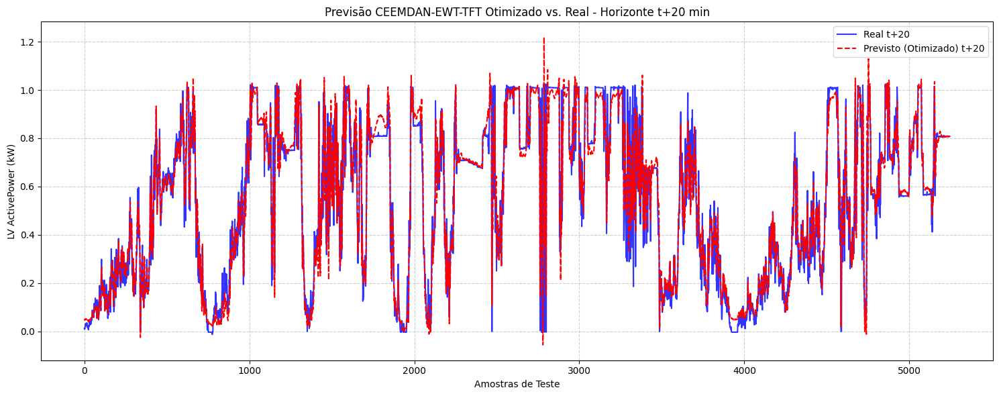

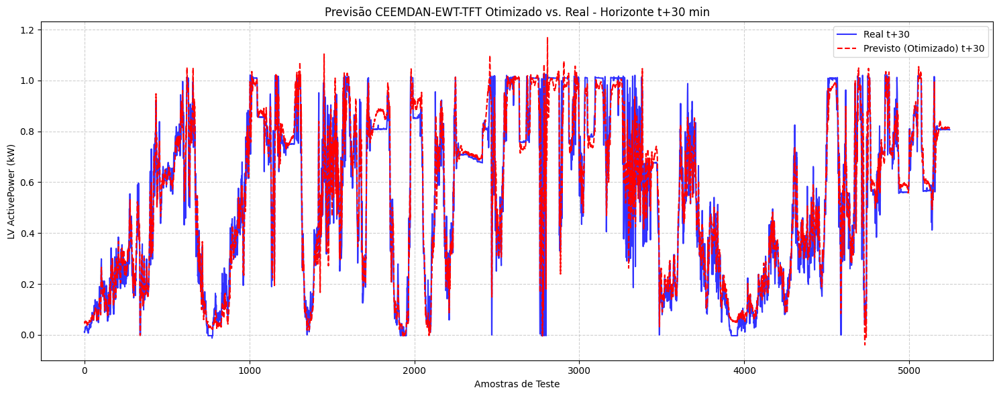

(<Functional name=functional, built=True>,
 {'hidden_units': 32,
  'dropout_rate': 0.26010475808037614,
  'num_heads': 4,
  'learning_rate': 0.0018087787786653733,
  'batch_size': 64},
   Horizonte  MAPE (%)  RMSE (MW)  MAE (MW)        R²
 0  t+10 min  3.336221   0.050542  0.034350  0.974741
 1  t+20 min  3.948581   0.060671  0.040655  0.963587
 2  t+30 min  4.550084   0.069722  0.046848  0.951891)

In [12]:
proposed_method_tft_aggregator_with_optuna(new_data,i,look_back,data_partition,cap)

--- EXECUTANDO proposed_method_gru EM MODO DE TREINAMENTO ---
Iniciando decomposição do sinal (CEEMDAN + EWT)...
Decomposição concluída e salva.
--- Q0.1 | Treinando GRU para: imf_denoised ---


I0000 00:00:1761759981.966176   54433 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13949 MB memory:  -> device: 0, name: Tesla T4, pci bus id: 0000:00:1e.0, compute capability: 7.5
/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
I0000 00:00:1761759984.592883   57164 cuda_dnn.cc:529] Loaded cuDNN version 90701


--- Q0.1 | Treinando GRU para: imf_1 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_2 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_3 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_4 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_5 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_6 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_7 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_8 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_9 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_10 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_11 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_12 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.1 | Treinando GRU para: imf_13 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_denoised ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_1 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_2 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_3 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_4 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_5 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_6 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_7 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_8 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_9 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_10 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_11 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_12 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.5 | Treinando GRU para: imf_13 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_denoised ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_1 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_2 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_3 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_4 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_5 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_6 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_7 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_8 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_9 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_10 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_11 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_12 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


--- Q0.9 | Treinando GRU para: imf_13 ---


/home/zeus/miniconda3/envs/cloudspace/lib/python3.10/site-packages/keras/src/layers/rnn/rnn.py:199: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Aplicando correção de cruzamento de quantis...

===== Métricas Completas (CEEMDAN-EWT-GRU) =====
Horizonte t+10: MAPE=1.9989%, RMSE=0.0315, MAE=0.0206, R²=0.9902
Horizonte t+20: MAPE=2.5127%, RMSE=0.0410, MAE=0.0259, R²=0.9834
Horizonte t+30: MAPE=2.7590%, RMSE=0.0448, MAE=0.0284, R²=0.9802


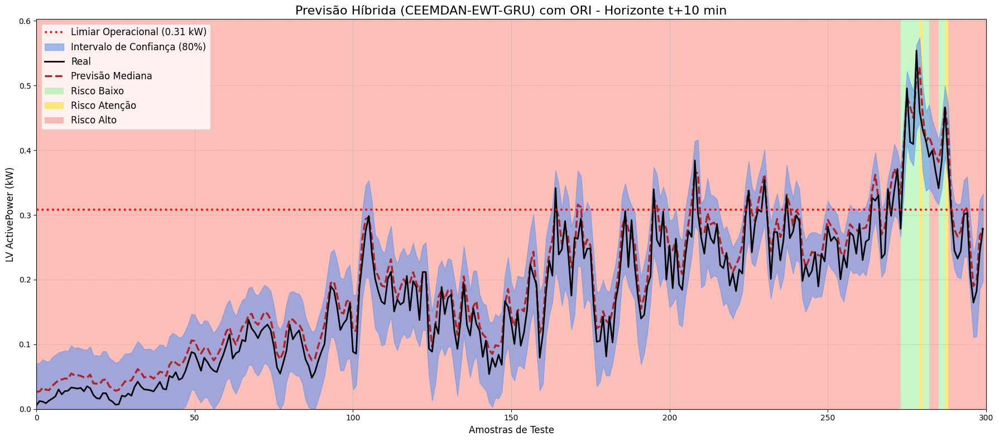

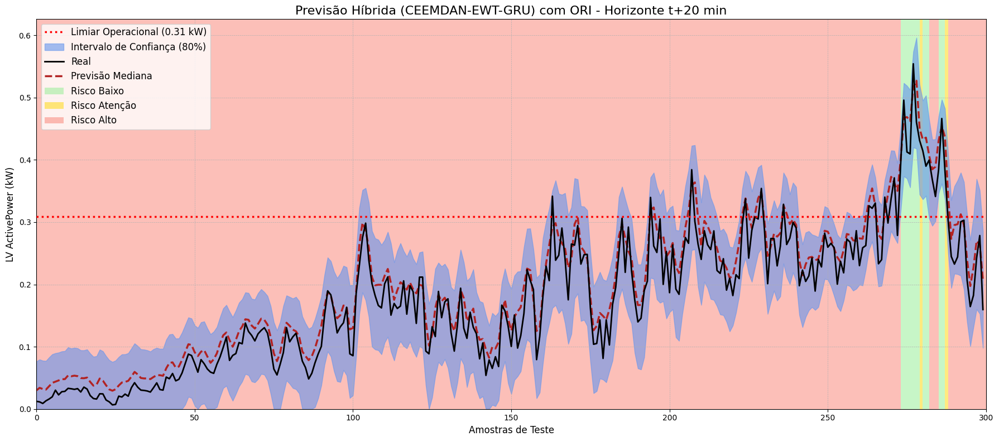

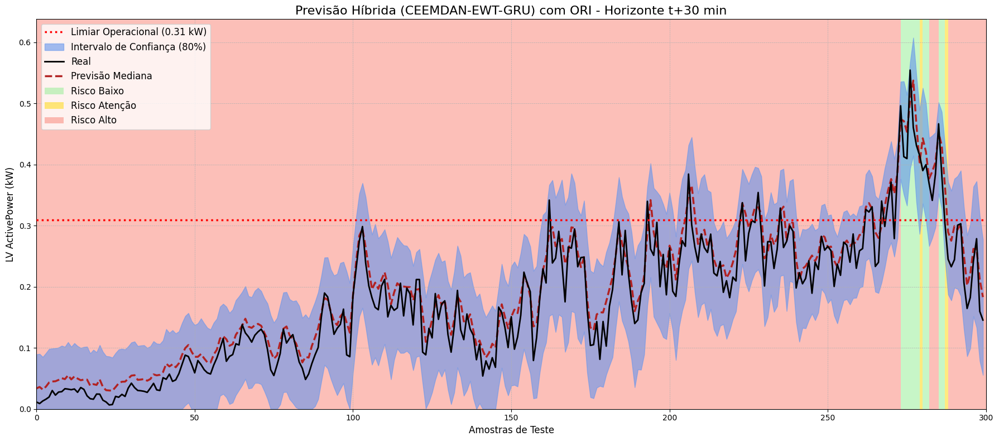

({0.1: array([[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.7120273 , 0.7096255 , 0.70007384],
         [0.7132224 , 0.70710325, 0.6959755 ],
         [0.71018946, 0.7083148 , 0.699837  ]], dtype=float32),
  0.5: array([[0.02646118, 0.02998137, 0.0337145 ],
         [0.02733934, 0.03403378, 0.03612378],
         [0.03289115, 0.03216743, 0.03187132],
         ...,
         [0.79692554, 0.7986723 , 0.79850733],
         [0.79829055, 0.79617584, 0.7945256 ],
         [0.79527175, 0.79762405, 0.7984972 ]], dtype=float32),
  0.9: array([[0.07035929, 0.07650957, 0.08936781],
         [0.07112682, 0.07953817, 0.09022683],
         [0.07679909, 0.07768014, 0.08510268],
         ...,
         [0.85246694, 0.8551996 , 0.86702394],
         [0.8539623 , 0.8525118 , 0.86206937],
         [0.850499  , 0.8537597 , 0.866782  ]], dtype=float32)},
 array([[0.0060356, 0.0123626, 0.0114462],
  

In [13]:
proposed_method_gru(new_data,i,look_back,data_partition,cap)

--- Gerando Gráficos para Modelos Benchmark (Ordenados) ---


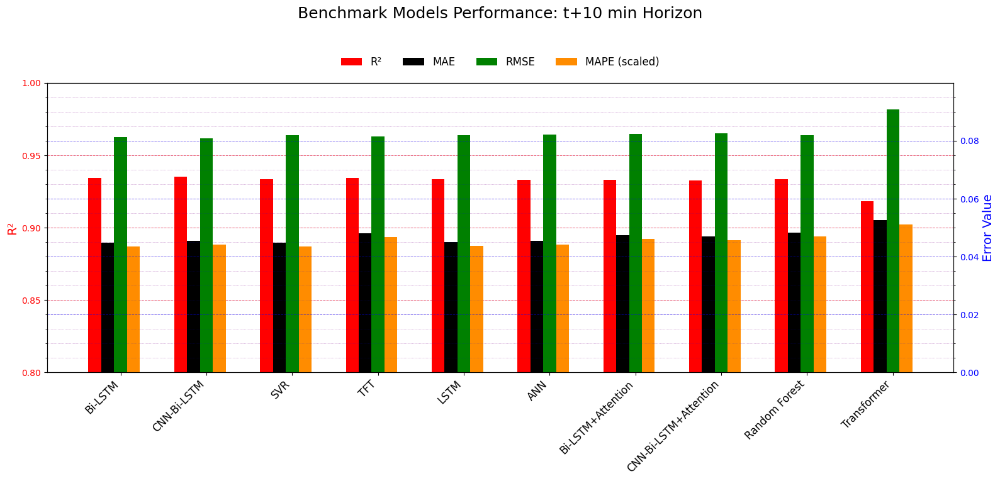

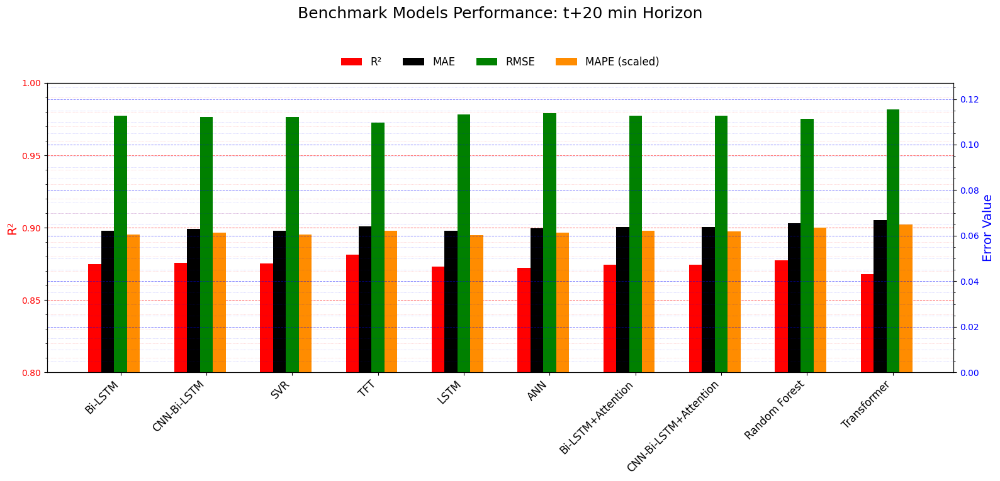

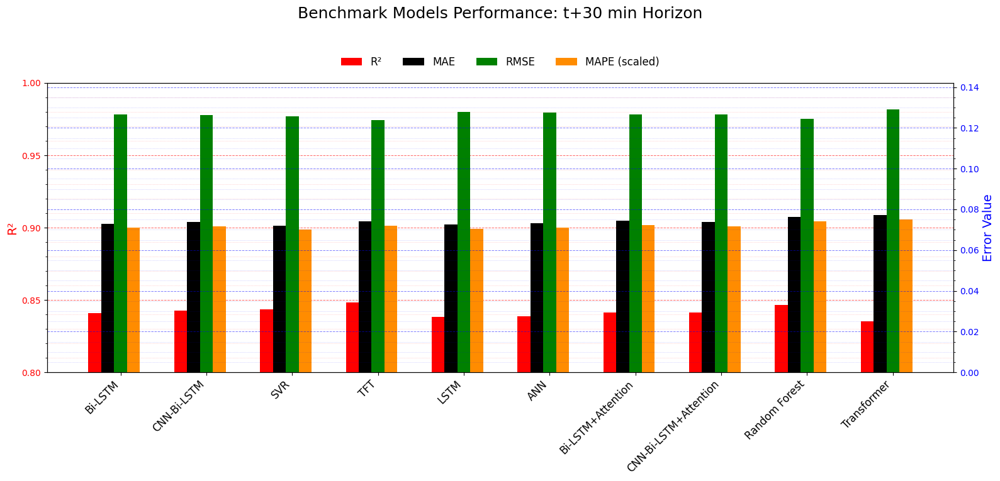

In [14]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

# ===================================================================
# 1. DADOS E CRIAÇÃO DO DATAFRAME (BENCHMARK)
# ===================================================================
# Recriar os dados da tabela de MODELOS BENCHMARK
data_benchmark = {
    'Model': [
        'SVR', 'ANN', 'Random Forest', 'LSTM', 'Bi-LSTM', 'Bi-LSTM+Attention',
        'CNN-Bi-LSTM', 'CNN-Bi-LSTM+Attention', 'Transformer', 'TFT'
    ],
    # --- Horizonte t+10 min ---
    'MAPE_t10': [4.3495, 4.4157, 4.6907, 4.3708, 4.3486, 4.6072, 4.4175, 4.5669, 5.1096, 4.6762],
    'RMSE_t10': [0.0819, 0.0822, 0.0820, 0.0819, 0.0814, 0.0823, 0.0809, 0.0825, 0.0909, 0.0815],
    'MAE_t10':  [0.0448, 0.0455, 0.0483, 0.0450, 0.0448, 0.0474, 0.0455, 0.0470, 0.0526, 0.0481],
    'R2_t10':   [0.9337, 0.9332, 0.9335, 0.9337, 0.9344, 0.9330, 0.9353, 0.9327, 0.9182, 0.9343],
    # --- Horizonte t+20 min ---
    'MAPE_t20': [6.0404, 6.1344, 6.3677, 6.0281, 6.0454, 6.2033, 6.1308, 6.2016, 6.5040, 6.2143],
    'RMSE_t20': [0.1122, 0.1137, 0.1112, 0.1132, 0.1126, 0.1128, 0.1121, 0.1126, 0.1155, 0.1096],
    'MAE_t20':  [0.0622, 0.0632, 0.0656, 0.0621, 0.0622, 0.0639, 0.0631, 0.0639, 0.0670, 0.0640],
    'R2_t20':   [0.8754, 0.8721, 0.8776, 0.8731, 0.8747, 0.8742, 0.8757, 0.8746, 0.8680, 0.8812],
    # --- Horizonte t+30 min ---
    'MAPE_t30': [7.0063, 7.0986, 7.4162, 7.0488, 7.0931, 7.2290, 7.1550, 7.1766, 7.4920, 7.1999],
    'RMSE_t30': [0.1258, 0.1276, 0.1245, 0.1278, 0.1267, 0.1265, 0.1262, 0.1267, 0.1291, 0.1238],
    'MAE_t30':  [0.0721, 0.0731, 0.0764, 0.0726, 0.0730, 0.0744, 0.0737, 0.0739, 0.0771, 0.0741],
    'R2_t30':   [0.8434, 0.8389, 0.8466, 0.8384, 0.8410, 0.8415, 0.8425, 0.8412, 0.8351, 0.8484]
}

# Criar o DataFrame
df_benchmark = pd.DataFrame(data_benchmark)

# Reordenar o DataFrame para destacar os melhores modelos benchmark
desired_order_benchmark = [
    'Bi-LSTM',
    'CNN-Bi-LSTM',
    'SVR',
    'TFT',
    'LSTM',
    'ANN',
    'Bi-LSTM+Attention',
    'CNN-Bi-LSTM+Attention',
    'Random Forest',
    'Transformer'
]
df_benchmark['Model'] = pd.Categorical(df_benchmark['Model'], categories=desired_order_benchmark, ordered=True)
df_benchmark_sorted = df_benchmark.sort_values('Model')


# ===================================================================
# 2. FUNÇÃO DE PLOTAGEM OTIMIZADA (REUTILIZADA)
# ===================================================================
# A função plot_horizon_metrics já deve existir da célula anterior.
# Se este for um novo notebook, copie a função da resposta anterior aqui.
def plot_horizon_metrics(df, horizon_suffix, title):
    """
    Plota um gráfico de barras com eixo Y duplo, grade altamente refinada e
    escala MAPE para comparação visual direta com outras métricas de erro.
    """
    from matplotlib.ticker import MultipleLocator

    metric_r2 = f'R2{horizon_suffix}'
    mape_col_scaled = f'MAPE_scaled{horizon_suffix}'
    df[mape_col_scaled] = df[f'MAPE{horizon_suffix}'] / 100
    metrics_error_scaled = [f'MAE{horizon_suffix}', f'RMSE{horizon_suffix}', mape_col_scaled]

    models = df['Model']
    x = np.arange(len(models))
    width = 0.15

    fig, ax1 = plt.subplots(figsize=(16, 8))
    ax2 = ax1.twinx()

    colors = {
        metric_r2: 'red',
        f'MAE{horizon_suffix}': 'black',
        f'RMSE{horizon_suffix}': 'green',
        mape_col_scaled: 'darkorange'
    }
    
    ax1.bar(x - 2*width, df[metric_r2], width, label='R²', color=colors[metric_r2])
    ax2.bar(x - width, df[metrics_error_scaled[0]], width, label='MAE', color=colors[metrics_error_scaled[0]])
    ax2.bar(x,       df[metrics_error_scaled[1]], width, label='RMSE', color=colors[metrics_error_scaled[1]])
    ax2.bar(x + width, df[metrics_error_scaled[2]], width, label='MAPE', color=colors[metrics_error_scaled[2]])

    ax1.set_ylabel('R²', color='red', fontsize=14)
    ax1.tick_params(axis='y', labelcolor='red', which='both')
    ax1.set_ylim(0.8, 1.0) # Zoom no topo do eixo R² para benchmarks
    
    ax2.set_ylabel('Error Value', color='blue', fontsize=14)
    ax2.tick_params(axis='y', labelcolor='blue', which='both')
    max_error = df[metrics_error_scaled].max().max()
    ax2.set_ylim(0, max_error * 1.1)

    ax1.yaxis.set_major_locator(MultipleLocator(0.05))
    ax1.yaxis.set_minor_locator(MultipleLocator(0.01))
    
    ax2.yaxis.set_major_locator(MultipleLocator(0.02))
    ax2.yaxis.set_minor_locator(MultipleLocator(0.005))

    ax1.grid(which='major', axis='y', linestyle='--', linewidth=0.7, color='red', alpha=0.6)
    ax1.grid(which='minor', axis='y', linestyle=':', linewidth=0.5, color='red', alpha=0.3)
    ax2.grid(which='major', axis='y', linestyle='--', linewidth=0.7, color='blue', alpha=0.5)
    ax2.grid(which='minor', axis='y', linestyle=':', linewidth=0.5, color='blue', alpha=0.3)
    
    ax1.set_xticks(x)
    ax1.set_xticklabels(models, rotation=45, ha="right", fontsize=12)
    
    fig.suptitle(title, fontsize=18)

    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='lower center', bbox_to_anchor=(0.5, 1.02),
               ncol=4, fontsize=12, frameon=False)
    
    fig.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.show()

# ===================================================================
# 3. GERAR OS GRÁFICOS (BENCHMARK)
# ===================================================================
print("--- Gerando Gráficos para Modelos Benchmark (Ordenados) ---")
plot_horizon_metrics(df_benchmark_sorted, '_t10', 'Benchmark Models Performance: t+10 min Horizon')
plot_horizon_metrics(df_benchmark_sorted, '_t20', 'Benchmark Models Performance: t+20 min Horizon')
plot_horizon_metrics(df_benchmark_sorted, '_t30', 'Benchmark Models Performance: t+30 min Horizon')


--- Gerando Gráficos para Modelos Híbridos (Ordenados) ---


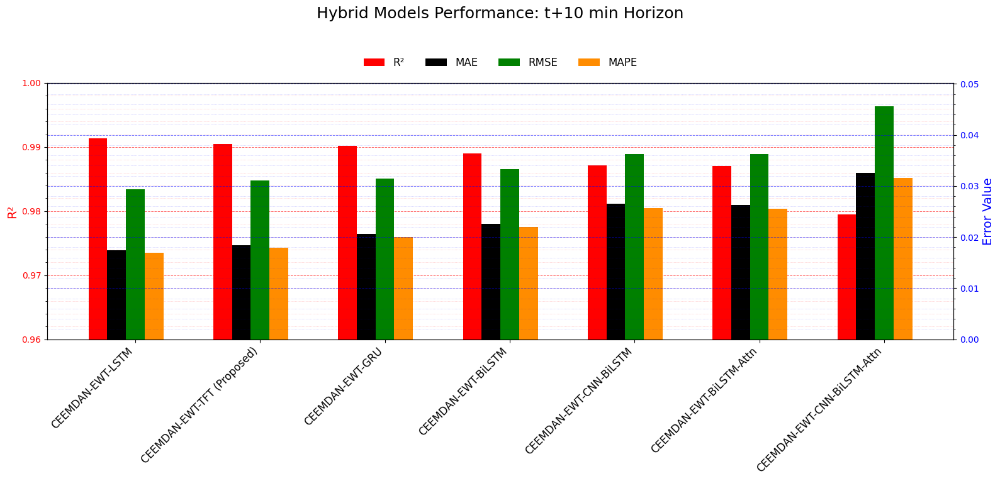

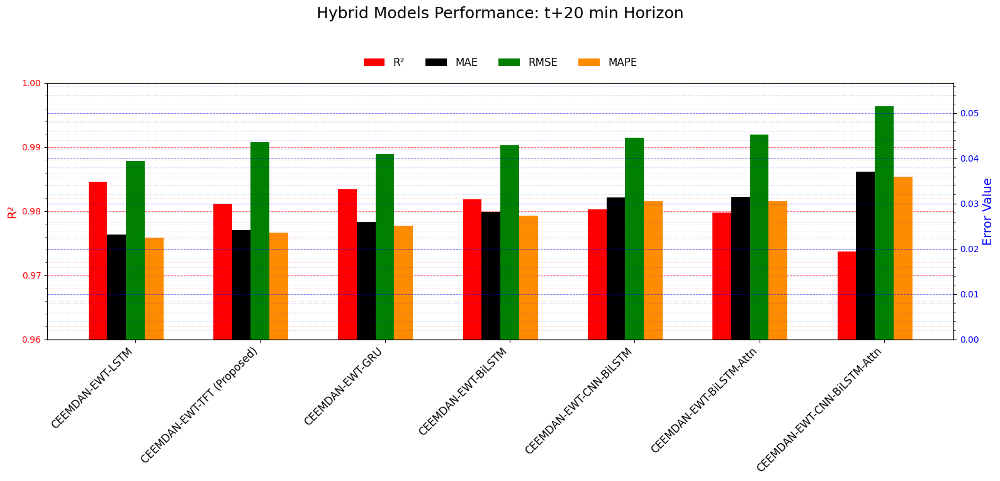

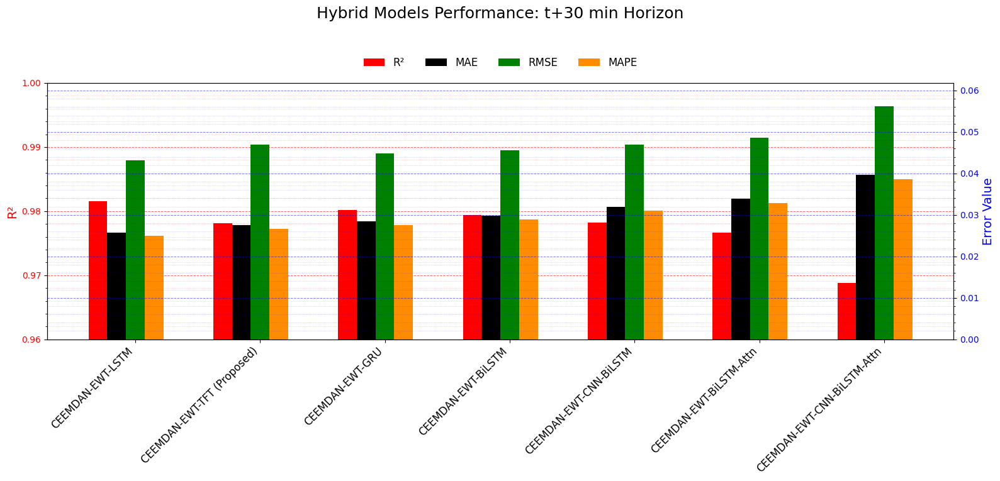

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator

# ===================================================================
# 1. DADOS E CRIAÇÃO DO DATAFRAME
# ===================================================================
# Recriar os dados da tabela de MODELOS HÍBRIDOS
data_hybrid = {
    'Model': [
        'CEEMDAN-EWT-LSTM', 
        'CEEMDAN-EWT-BiLSTM', 
        'CEEMDAN-EWT-BiLSTM-Attn', 
        'CEEMDAN-EWT-CNN-BiLSTM', 
        'CEEMDAN-EWT-CNN-BiLSTM-Attn', 
        'CEEMDAN-EWT-GRU', 
        'CEEMDAN-EWT-TFT (Proposed)'
    ],
    # --- Horizonte t+10 min ---
    'MAPE_t10': [1.6947, 2.1980, 2.5546, 2.5715, 3.1615, 1.9989, 1.7907],
    'RMSE_t10': [0.0294, 0.0333, 0.0363, 0.0362, 0.0456, 0.0315, 0.0311],
    'MAE_t10':  [0.0174, 0.0226, 0.0263, 0.0265, 0.0326, 0.0206, 0.0184],
    'R2_t10':   [0.9914, 0.9890, 0.9870, 0.9871, 0.9795, 0.9902, 0.9905],
    # --- Horizonte t+20 min ---
    'MAPE_t20': [2.2512, 2.7308, 3.0568, 3.0480, 3.5923, 2.5127, 2.3532],
    'RMSE_t20': [0.0394, 0.0429, 0.0452, 0.0446, 0.0515, 0.0410, 0.0436],
    'MAE_t20':  [0.0232, 0.0281, 0.0315, 0.0314, 0.0370, 0.0259, 0.0242],
    'R2_t20':   [0.9846, 0.9818, 0.9798, 0.9803, 0.9737, 0.9834, 0.9812],
    # --- Horizonte t+30 min ---
    'MAPE_t30': [2.5011, 2.8965, 3.2878, 3.1083, 3.8575, 2.7590, 2.6681],
    'RMSE_t30': [0.0431, 0.0456, 0.0486, 0.0470, 0.0562, 0.0448, 0.0470],
    'MAE_t30':  [0.0258, 0.0298, 0.0339, 0.0320, 0.0397, 0.0284, 0.0275],
    'R2_t30':   [0.9816, 0.9794, 0.9766, 0.9782, 0.9688, 0.9802, 0.9781]
}

# Criar o DataFrame
df_hybrid = pd.DataFrame(data_hybrid)

# Reordenar o DataFrame para destacar os 3 melhores modelos
desired_order = [
    'CEEMDAN-EWT-LSTM',
    'CEEMDAN-EWT-TFT (Proposed)',
    'CEEMDAN-EWT-GRU',
    'CEEMDAN-EWT-BiLSTM',
    'CEEMDAN-EWT-CNN-BiLSTM',
    'CEEMDAN-EWT-BiLSTM-Attn',
    'CEEMDAN-EWT-CNN-BiLSTM-Attn'
]
df_hybrid['Model'] = pd.Categorical(df_hybrid['Model'], categories=desired_order, ordered=True)
df_hybrid_sorted = df_hybrid.sort_values('Model')


# ===================================================================
# 2. FUNÇÃO DE PLOTAGEM OTIMIZADA
# ===================================================================
def plot_horizon_metrics(df, horizon_suffix, title):
    """
    Plota um gráfico de barras com eixo Y duplo, grade altamente refinada e
    escala MAPE para comparação visual direta com outras métricas de erro.
    """
    # Métricas a serem plotadas
    metric_r2 = f'R2{horizon_suffix}'
    
    # Criar uma coluna temporária para o MAPE escalado (dividido por 100)
    mape_col_scaled = f'MAPE_scaled{horizon_suffix}'
    df[mape_col_scaled] = df[f'MAPE{horizon_suffix}'] / 100
    
    # As métricas de erro agora usam a coluna MAPE escalada
    metrics_error_scaled = [f'MAE{horizon_suffix}', f'RMSE{horizon_suffix}', mape_col_scaled]

    # Configurações do gráfico
    models = df['Model']
    x = np.arange(len(models))
    width = 0.15

    fig, ax1 = plt.subplots(figsize=(16, 8))
    ax2 = ax1.twinx()

    # Cores
    colors = {
        metric_r2: 'red',
        f'MAE{horizon_suffix}': 'black',
        f'RMSE{horizon_suffix}': 'green',
        mape_col_scaled: 'darkorange'
    }
    
    # Plotar as barras
    ax1.bar(x - 2*width, df[metric_r2], width, label='R²', color=colors[metric_r2])
    ax2.bar(x - width, df[metrics_error_scaled[0]], width, label='MAE', color=colors[metrics_error_scaled[0]])
    ax2.bar(x,       df[metrics_error_scaled[1]], width, label='RMSE', color=colors[metrics_error_scaled[1]])
    ax2.bar(x + width, df[metrics_error_scaled[2]], width, label='MAPE', color=colors[metrics_error_scaled[2]])

    # Configurar os eixos e a grade
    ax1.set_ylabel('R²', color='red', fontsize=14)
    ax1.tick_params(axis='y', labelcolor='red', which='both')
    ax1.set_ylim(0.96, 1.0) # Zoom no topo do eixo R²
    
    ax2.set_ylabel('Error Value', color='blue', fontsize=14)
    ax2.tick_params(axis='y', labelcolor='blue', which='both')
    max_error = df[metrics_error_scaled].max().max()
    ax2.set_ylim(0, max_error * 1.1)

    # Definir os localizadores de grade para MÁXIMO detalhamento
    ax1.yaxis.set_major_locator(MultipleLocator(0.01))
    ax1.yaxis.set_minor_locator(MultipleLocator(0.002))
    
    ax2.yaxis.set_major_locator(MultipleLocator(0.01))
    ax2.yaxis.set_minor_locator(MultipleLocator(0.002))

    # Ativar a grade
    ax1.grid(which='major', axis='y', linestyle='--', linewidth=0.7, color='red', alpha=0.6)
    ax1.grid(which='minor', axis='y', linestyle=':', linewidth=0.5, color='red', alpha=0.3)
    ax2.grid(which='major', axis='y', linestyle='--', linewidth=0.7, color='blue', alpha=0.5)
    ax2.grid(which='minor', axis='y', linestyle=':', linewidth=0.5, color='blue', alpha=0.3)
    
    ax1.set_xticks(x)
    ax1.set_xticklabels(models, rotation=45, ha="right", fontsize=12)
    
    fig.suptitle(title, fontsize=18)

    # Legenda
    lines, labels = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax2.legend(lines + lines2, labels + labels2, loc='lower center', bbox_to_anchor=(0.5, 1.02),
               ncol=4, fontsize=12, frameon=False)
    
    fig.tight_layout(rect=[0, 0.03, 1, 0.96])
    plt.show()


# ===================================================================
# 3. GERAR OS GRÁFICOS
# ===================================================================
print("--- Gerando Gráficos para Modelos Híbridos (Ordenados) ---")
plot_horizon_metrics(df_hybrid_sorted, '_t10', 'Hybrid Models Performance: t+10 min Horizon')
plot_horizon_metrics(df_hybrid_sorted, '_t20', 'Hybrid Models Performance: t+20 min Horizon')
plot_horizon_metrics(df_hybrid_sorted, '_t30', 'Hybrid Models Performance: t+30 min Horizon')

